In [438]:
import io
import pprint
from collections import OrderedDict, defaultdict, namedtuple
from dataclasses import dataclass

# import janitor
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.transforms as tmpl
import mpmath as mp
import numpy as np
import pandas as pd
import PIL
import scipy.integrate as si
import scipy.interpolate as sin
import scipy.optimize as so
import scipy.signal as sg
import scipy.special as ss
import scipy.stats as stats
import sympy as sym
import xlrd
from datetime import datetime
from functools import partial
from matplotlib import rcParams
from matplotlib.legend import Legend
from matplotlib.lines import Line2D
from matplotlib.ticker import FormatStrFormatter, ScalarFormatter
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image
from scipy.interpolate import griddata
from sympy import symbols
from sympy.utilities.lambdify import implemented_function, lambdify

## Abi
from disp_calc import disp


pp = pprint.PrettyPrinter(indent=4)


rcParams["font.family"] = "sans-serif"
rcParams["font.sans-serif"] = ["Arial"]

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["mathtext.fontset"] = "stix"
plt.rcParams["font.size"] = 10
plt.rcParams["xtick.direction"] = "in"
plt.rcParams["ytick.direction"] = "in"
plt.rcParams["xtick.bottom"] = plt.rcParams["xtick.labelbottom"] = True
plt.rcParams["xtick.top"] = plt.rcParams["xtick.labeltop"] = False
plt.rcParams['figure.facecolor'] = 'w'

axsfs = 11
lblfs = 9
lgdfs = 10
abfs = 11
fracfs = lblfs + 2
fig_file = r"C:\Users\ab16781\OneDrive - University of Bristol\Documents\1. phd\2. Papers\7. Walls\1. Paper Drafts\Figures"
color2='grey'
letter = {0:'(a)', 1:'(b)', 2:'(c)', 3:'(d)', 4:'(e)', 5:'(f)', 6:'(g)', 7:'(h)'}
letter2 = lambda i: f"({chr(97 + i)})"

This code presents the example hand calculations to determine wall rotations and deflections using the MSD Method.

Equation number's are from the online supplement version: Crispin et al_online supplement_v1.

## File Download

In [439]:
"""Change header in dataframe to be of the date-time format"""
def type_date(df, name):
    df = df.copy()
    for header in df.columns:
        head = header
        new_header = ""
        if isinstance(header, datetime):
            new_header = header
        elif header[0] == 'F':
            if "Sept" in header:
                header = header.replace("Sept", "Sep")
            new_header = datetime.strptime(header.replace(name+" ", ""), "%d-%b-%y")
        elif header != " ":
            new_header = datetime.strptime(header.replace(name+" ", ""), "%d-%b-%y")
        df.rename(columns={head: new_header}, inplace=True)
    return df

"""Read excel spreadsheet and format dataframes"""
def read_file(file_loc, file, sheet_name, inclonometers):
    aa = pd.read_excel(file_loc+file, sheet_name=sheet_name) # Read Excel Spreadsheet
    Disp = {}
    for inc in inclonometers: # Define inclonometer of interest
        name = inc+"! "

        ## Find column and index of Inclonometer Name
        a = aa.where(aa==name).dropna(how="all").dropna(axis=1)
        index = a.index.tolist()[0]
        column = a.columns.tolist()[0]

        ## Output top and bottom displacements for each date
        top_bot_disp = aa[index+1:index+4].dropna(axis=1, how="all") # Remove columns with NaNs
        top_bot_disp = pd.DataFrame(top_bot_disp.values[1:], columns=top_bot_disp.iloc[0]) # Make date-time header
        top_bot_disp.set_index(np.NaN, inplace=True) # Define index
        top_bot_disp.index.name = None # Remove index name
        type_date(top_bot_disp, inc) # Ensure header is all in datetime format

        ## Select length of level column
        stop = index+5
        level = 1
        while not np.isnan(level):
            level = aa["Unnamed: 1"][stop]
            stop = stop + 1

        ## Create displacement dataframe
        dates = aa[index+1:index+2]
        disp = aa[index+5:stop-1]
        disp = pd.concat([dates, disp]).dropna(axis=1, how='all') ## Displacement data frame
        if sheet == "Y-Y":
            del disp["INCLINOMETER Y-Y READINGS"]
        else:
            del disp["INCLINOMETER X-X READINGS"]
        del disp["Unnamed: 2"]

        disp = pd.DataFrame(disp.values[1:], columns=disp.iloc[0]) # Make date-time header
        disp.set_index(np.NaN, inplace=True) # Define index
        disp.index.name = None # Remove index name
        disp = type_date(disp, inc) # Ensure header is all in datetime format
        #Disp[inc] = disp
    return disp #Disp

Disp = {}
loc = r"C:\Users\ab16781\OneDrive - University of Bristol\Documents\1. phd\2. Papers\7. Walls\2. Information Provided"
Inclonometers = ["F37", "F48", "F56", "F75", "F95", "F124", "F134"]
Sheet = ["Y-Y", "Y-Y", "Y-Y", "X-X", "X-X", "Y-Y", "Y-Y"]

for inc, sheet in zip(Inclonometers, Sheet):
    Disp[inc] = read_file(loc, r"\w3_inclinometerdata_cut.xlsx", sheet, [inc])

c:\Users\ab16781\Anaconda3\envs\lizzie2\lib\site-packages\pandas\core\indexes\base.py:6982: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  return Index(sequences[0], name=names)
c:\Users\ab16781\Anaconda3\envs\lizzie2\lib\site-packages\pandas\core\indexes\base.py:6982: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  return Index(sequences[0], name=names)
c:\Users\ab16781\Anaconda3\envs\lizzie2\lib\site-packages\pandas\core\indexes\base.py:6982: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  return Index(sequences[0], name=names)
c:\Users\ab16781\Anaconda3\envs\lizzie2\lib\site-packages\pandas\core\indexes\base.py:6982: FutureWarning: In a future version, the Index constructor w

In [408]:
for inc in Inclonometers:
    display(Disp[inc])

81,1983-02-23,1983-05-31,1983-08-05,1984-02-17,1984-07-13,1984-11-21,1984-11-26,1985-02-25,1985-05-07,1985-06-04,...,1987-02-13,1987-03-20,1987-05-13,1987-05-22,1987-07-14,1987-07-22,1987-07-30,1987-09-29,1990-10-12,1990-11-29
18.200000,0,4.152036,-0.499987,-6.607485,-10.79599,-6.262979,-10.43847,-3.145989,-12.32698,-9.823488,...,-7.466494,-8.770473,-6.520495,-7.770495,-0.174471,-3.858981,-2.974474,-4.843478,-9.303607,-15.30887
17.200000,0,4.452024,-0.29999,-6.157488,-10.396,-14.43951,-19.022,-9.843499,-12.22699,-10.17349,...,-8.716494,-10.22049,-7.970492,-9.220491,-1.824481,-5.358981,-4.624484,-6.193484,-10.17861,-10.90888
16.200000,0,4.602003,-0.250002,-5.857501,-10.14601,-12.96951,-17.3155,-8.560006,-12.27701,-10.67351,...,-10.1165,-11.82051,-9.570498,-10.8205,-3.624499,-7.00899,-6.424502,-7.693499,-11.64862,-11.53162
15.200000,0,5.020994,0.145994,-5.365511,-9.473009,-13.12051,-17.29351,-8.87452,-12.0195,-10.59651,...,-10.978,-12.76652,-10.63201,-11.84351,-5.040011,-8.120516,-7.647509,-8.732012,-12.45188,-12.14612
14.200000,0,4.671506,-0.126498,-5.511004,-9.484011,-13.02851,-17.0745,-8.955499,-12.36501,-11.273,...,-12.60449,-14.36599,-12.42,-13.62001,-7.074008,-9.92,-9.623995,-10.52001,-14.03388,-13.55312
13.200000,0,4.432493,-0.304003,-5.5385,-9.450014,-13.1605,-17.00651,-9.200997,-12.13051,-11.47701,...,-13.91251,-15.58551,-13.7625,-15.00101,-8.655001,-11.301,-11.205,-11.9395,-15.25087,-14.57288
12.200000,0,4.866003,0.294996,-4.866503,-8.689501,-12.36199,-16.02151,-8.566003,-11.59749,-11.163,...,-14.787,-16.283,-14.71399,-15.887,-9.740992,-12.2255,-12.2525,-12.837,-16.50887,-15.65313
11.200000,0,4.84049,0.353994,-4.642008,-8.365015,-12.19901,-15.68152,-8.562501,-11.6345,-11.19601,...,-16.09699,-17.62401,-16.00851,-17.27401,-11.28951,-13.5855,-13.78951,-14.26251,-17.86788,-16.83713
10.200000,0,4.745489,0.231992,-4.525507,-8.148508,-12.06951,-15.30201,-8.510003,-11.46,-11.04851,...,-17.211,-18.64551,-17.265,-18.48801,-12.65351,-14.71101,-14.99951,-15.41101,-18.88787,-17.81563
9.200001,0,4.341482,0.008993,-4.575511,-8.137018,-12.14351,-15.13951,-8.76101,-11.09052,-10.69052,...,-17.94901,-19.84951,-18.20301,-19.44151,-13.71851,-15.56452,-16.01851,-16.38001,-19.74288,-18.57889


116,1983-02-23,1983-05-31,1983-08-05,1984-02-17,1984-07-13,1985-02-01,1985-05-07,1985-06-04,1985-08-05,1985-09-09,...,1987-03-20,1987-05-06,1987-05-26,1987-06-05,1987-06-29,1987-09-29,1989-05-03,1990-08-28,1990-10-03,1991-09-12
18.220000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17.220000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16.220000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15.220000,0,1.15,-4.275,-5.6,-6.35,-11.6985,-6.986003,-7.035502,-9.083002,-10.554,...,-6.052003,-3.152003,-3.252004,-1.791503,0.037495,-3.802003,-3.970504,-2.847004,-3.873003,-3.186003
14.220000,0,1.35,-5.95,-7.075,-7.8,-12.0815,-7.631495,-8.073996,-10.253,-11.6635,...,-8.163998,-5.263997,-5.442997,-4.032497,-2.300996,-5.874497,-6.192997,-5.288247,-6.042996,-5.253497
13.220000,0,1.4,-5.675,-6.9,-7.5,-11.3065,-6.935498,-8.009499,-10.2885,-11.6885,...,-9.217999,-6.317999,-6.715499,-5.3155,-3.6945,-6.996999,-7.505,-6.63425,-7.275999,-6.4365
12.220000,0,1.5,-5,-6.25,-6.7,-10.305,-6.2315,-7.7475,-10.1265,-11.487,...,-10.185,-7.364001,-7.774502,-6.453502,-5.011501,-8.024502,-8.653502,-7.890751,-8.403502,-7.514001
11.220000,0,1.5,-4.625,-5.875,-6.275,-9.359498,-5.635999,-7.156999,-9.675499,-10.986,...,-11.042,-8.242001,-8.7605,-7.421,-6.1395,-9.0105,-9.779,-8.96875,-9.489499,-8.471
10.220000,0,1.4,-4.975,-6.25,-6.7,-9.356998,-5.706998,-7.601999,-10.1125,-11.4915,...,-12.7895,-10.108,-10.6975,-9.3475,-8.1765,-10.8685,-11.787,-10.95575,-11.4475,-10.3185
9.219999,0,1.25,-4.325,-5.675,-6.125,-8.5525,-5.1395,-7.1395,-9.6395,-11.0395,...,-13.6955,-11.1245,-11.8035,-10.4535,-9.382502,-11.914,-12.9035,-12.15125,-12.593,-11.364


151,1983-02-23,1983-08-05,1984-02-17,1984-07-13,1984-10-19,1985-02-01,1985-05-07,1985-06-04,1985-08-05,1985-09-09,...,1987-05-13,1987-05-26,1987-06-05,1987-06-29,1987-07-14,1987-09-29,1989-05-03,1990-08-28,1990-10-03,1991-09-12
18.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15.4,0,-8.618498,-6.485495,-7.832998,-3.830507,-8.872009,-7.97951,-7.158513,-8.310013,-9.108515,...,-1.140518,-3.193019,-2.984512,-2.63002,-1.978516,-1.783012,-5.40802,-1.620509,-1.359515,2.61398
14.4,0,-7.820494,-5.982504,-7.120497,-3.045007,-8.127007,-7.809009,-7.106008,-8.304504,-8.959009,...,-2.076012,-4.233012,-3.974503,-3.867004,-3.12001,-2.677513,-6.302513,-2.636256,-2.301013,1.722485
13.4,0,-7.892996,-6.173994,-7.111998,-3.379999,-7.354492,-7.103,-6.645497,-7.942497,-8.543993,...,-2.566994,-4.8725,-4.612503,-4.657997,-3.859497,-3.2155,-7.0345,-3.274997,-2.889003,1.184499
12.4,0,-7.389006,-5.851004,-6.629507,-2.725504,-6.608002,-6.309497,-6.296002,-7.693008,-8.293009,...,-3.216003,-5.574504,-5.266006,-5.558502,-4.758507,-3.914505,-7.642509,-4.0255,-3.638011,0.485494
11.4,0,-6.653006,-5.315001,-5.943502,-1.98501,-5.955009,-5.800509,-6.285504,-7.637001,-8.285509,...,-4.060013,-6.517001,-6.110008,-6.652512,-5.804008,-4.80851,-8.727509,-5.066501,-4.679011,-0.505512
10.4,0,-6.383001,-5.164,-5.683004,-1.937006,-5.371002,-5.123996,-5.769498,-7.119499,-7.721002,...,-4.830505,-7.387507,-6.880501,-7.721504,-6.823006,-5.628998,-9.554001,-5.988498,-5.552508,-1.329002
9.4,0,-5.927999,-4.727995,-5.227995,-1.543001,-4.641991,-4.537501,-5.235997,-6.585999,-7.137498,...,-5.6455,-8.351001,-7.695499,-8.788002,-7.888,-6.493996,-10.6615,-7.001998,-6.515998,-2.291


194,1982-09-02,1983-02-23,1983-03-24,1983-04-29,1983-08-05,1984-02-21,1984-07-18,1985-02-01,1985-05-08,1985-06-04,...,1987-02-26,1987-03-25,1987-04-13,1987-04-29,1987-05-06,1987-05-13,1987-05-22,1987-06-29,1987-07-14,1987-10-01
17.890000,0,-9.850006,-13.55,-16.5,-18.10001,-23.60001,-22.9,-30.2,-26.15,-24.15001,...,-32.15,-27.55,-26.60001,-21.5,-26.2,-26.60001,-28.90001,-18,-21.85001,-25.65001
16.890000,0,-7.049988,-10.5,-13.95,-15.59999,-21.09999,-20.3,-27.55,-22.99999,-21.49999,...,-29.95,-25.74999,-24.74999,-19.89999,-24.39999,-24.64999,-27.05,-16.59999,-20.34999,-23.75
15.890000,0,-5.300003,-8.649994,-12.39999,-14.1,-19.55,-18.6,-25.7,-21,-19.7,...,-28.85,-24.95,-23.89999,-19.25,-23.6,-23.8,-26.25,-16.14999,-19.84999,-22.95
14.890000,0,-1.999992,-5.349991,-8.999992,-10.74999,-16.09999,-14.99999,-22.05,-17.2,-15.55,...,-25.59999,-21.95,-20.89999,-16.45,-20.64999,-20.74999,-23.24999,-13.5,-17.09999,-20.14999
13.890000,0,-2.300003,-5.75,-9.150002,-11.05,-16.15,-15,-21.8,-16.8,-15.7,...,-26.5,-23.15,-22.05,-17.75,-21.75,-21.95,-24.4,-14.95,-18.55,-21.3
12.890000,0,-2.25,-5.699997,-9.050003,-10.9,-15.9,-14.7,-21.3,-16.4,-15.55,...,-27.15,-24,-22.9,-18.75,-22.55,-22.85,-25.2,-16.1,-19.65,-22.15
11.890000,0,-2.099998,-5.5,-8.900002,-10.65,-15.55,-14.25,-20.8,-15.8,-15.3,...,-27.8,-24.9,-23.55,-19.6,-23.25,-23.55,-25.95,-17.1,-20.65,-23
10.890000,0,-2.150002,-5.599998,-8.799995,-10.65,-15.35,-14.05,-20.5,-15.9,-15.6,...,-28.95,-26.3,-24.85,-21.1,-24.55,-24.85,-27.25,-18.65,-22.15,-24.4
9.889999,0,-1.700005,-4.950005,-8.150002,-9.950005,-14.4,-13.2,-19.45,-14.8,-14.9,...,-29.2,-26.8,-25.25,-21.60001,-25,-25.25,-27.7,-19.35001,-22.8,-24.9
8.889999,0,-1.100006,-4.100006,-7.300003,-9.050003,-13.35001,-12.15,-18.25,-13.9,-14,...,-29.3,-26.95,-25.55,-22.05,-25.4,-25.5,-27.95,-19.85001,-23.35001,-25.3


264,1983-03-02,1983-06-02,1983-08-05,1984-02-21,1984-07-18,1985-02-01,1985-05-08,1985-06-07,1985-08-08,1985-09-09,...,1987-02-26,1987-03-25,1987-05-06,1987-06-05,1987-06-23,1987-06-29,1987-10-01,1989-05-04,1990-10-03,1991-09-19
18.720000,0,-5,-10.65,-7.45,-8.6,-9.150001,-11.5,-13.3,-15.35,-15.4,...,-25.05791,-18.83801,-18.49701,-15.70801,-15.35801,-11.60531,-18.43501,-18.34001,-18.97001,-15.48001
17.720000,0,-4.9,-9.849999,-7.4,-8.849999,-9.45,-11,-12.75,-14.8,-15.1,...,-24.72141,-19.01241,-18.28871,-15.56201,-15.21201,-11.85151,-17.939,-17.93002,-18.48001,-14.87001
16.720000,0,-4.799999,-9.25,-7.549999,-9.199999,-9.65,-10.85,-12.45,-14.75,-15.2,...,-24.00031,-18.59581,-17.67851,-15.04301,-14.69301,-11.64131,-17.148,-17.22001,-17.63,-13.91001
15.720000,0,-4.799999,-8.699999,-7.449999,-9.200001,-9.9,-11.45,-11.9,-14.3,-14.85,...,-22.9706,-17.777,-16.7488,-14.152,-13.802,-10.9943,-16.241,-17.02999,-17.34999,-13.59999
14.720000,0,-4.65,-8.099998,-7.199999,-9.099998,-9.75,-10.6,-10.85,-13.45,-14.15,...,-23.53689,-18.54329,-17.41509,-14.868,-14.596,-12.06699,-16.96799,-17.85999,-18.08999,-14.33999
13.720000,0,-4.5,-7.450001,-6.9,-8.700001,-9.200001,-9.95,-10.05,-12.85,-13.6,...,-23.23879,-18.48429,-17.33429,-14.797,-14.50799,-12.27979,-16.85799,-17.85999,-18.14999,-14.35999
12.720000,0,-4.4,-6.9,-6.599998,-8.349998,-8.65,-9.149999,-9.249999,-12.2,-13.05,...,-23.35799,-18.85349,-17.62529,-15.126,-14.826,-12.82079,-17.17599,-18.00999,-18.34999,-14.47999
11.720000,0,-4.25,-6.400002,-6.25,-7.950001,-8.150002,-8.7,-8.500001,-11.6,-12.45,...,-23.33239,-18.99969,-17.78879,-15.302,-15.002,-13.15609,-17.352,-18.51999,-18.81999,-14.89999
10.720000,0,-4.099999,-5.999999,-5.900001,-7.599999,-7.7,-8.299999,-8.15,-11.15,-12.1,...,-23.74069,-19.51889,-18.27979,-15.831,-15.609,-13.87529,-17.88099,-18.68999,-18.99999,-15.02999
9.719999,0,-3.950001,-5.6,-5.65,-7.200001,-7.200001,-7.750001,-7.750001,-10.6,-11.55,...,-24.52719,-20.44449,-19.15539,-16.716,-16.555,-15.00089,-18.727,-19.33999,-19.61999,-15.57999


391,1983-03-04,1983-06-02,1983-08-08,1984-05-10,1984-07-11,1985-02-01,1985-05-08,1985-06-03,1985-06-03,1985-06-03,...,1987-04-16,1987-04-29,1987-05-06,1987-05-13,1987-06-23,1987-06-29,1987-10-27,1989-05-04,1990-10-15,1991-09-12
16.875,0,9.76175,11.36175,19.5585,19.45876,22.295,23.26626,20.17875,19.5075,22.72375,...,21.0425,16.97124,21.59,22.51625,20.3925,17.22375,21.61625,21.52125,23.04248,24.39
15.875,0,9.294244,10.89375,18.441,18.39124,20.00875,21.04,18.2425,19.72125,20.71875,...,20.7875,16.86625,21.31375,22.2375,20.1375,17.21875,21.3375,21.39,22.78749,24.00875
14.875,0,8.495751,9.995248,16.99325,16.99325,18.55375,19.44125,17.03251,20.03126,19.66376,...,21.35125,17.58,21.84875,22.775,20.70125,18.00625,21.87501,22.10625,23.40374,24.5275
13.875,0,7.752496,9.152253,15.74975,15.75,16.775,17.29375,15.4825,19.27375,18.3375,...,21.57749,17.93,22.00125,22.95125,20.90125,18.485,22.0775,22.55875,23.75624,24.80375
12.875,0,7.109506,8.459001,14.557,14.607,15.28125,15.57625,14.315,18.49375,17.475,...,22.21,18.61,22.5575,23.48125,21.4575,19.33875,22.71,23.415,24.48624,25.46
11.875,0,6.509995,7.759751,13.45751,13.5075,13.50375,13.6775,12.835,17.1375,16.21126,...,22.50375,18.95625,22.83,23.65125,21.6775,19.835,23.03,23.96125,24.88249,25.78
10.875,0,5.909997,7.109994,12.35774,12.4075,12.05375,12.20375,11.66125,16.2475,15.08751,...,23.08,19.60625,23.35125,24.075,22.1775,20.5825,23.55125,24.70625,25.50374,26.30125
9.875,0,5.357499,6.556993,11.3555,11.35474,10.70624,10.90875,10.64,15.51875,14.11625,...,23.78249,20.38499,23.93,24.5775,22.75374,21.35875,24.15625,25.5375,26.20874,26.87999
8.875,0,4.906251,6.005746,10.504,10.35375,9.559999,9.757497,9.791249,14.74125,13.29125,...,24.52875,21.31,24.62875,25.17625,23.40249,22.23375,24.87875,26.43125,27.03124,27.57875
7.875,0,4.408746,5.407739,9.556245,9.355748,8.524995,8.753747,9.032495,13.90374,12.45375,...,25.24375,22.24874,25.3175,25.79125,24.09375,23.1225,25.515,27.2725,27.80687,28.29375


424,1983-05-31,1983-08-08,1984-05-10,1984-07-11,1985-02-01,1985-05-08,1985-06-03,1985-08-06,1985-09-04,1985-11-18,...,1987-02-19,1987-03-20,1987-06-23,1987-06-29,1987-07-22,1988-02-02,1989-05-04,1990-08-29,1990-10-04,1991-09-12
15.720000,0,1.900009,5.300003,7.950012,9.710012,16.38401,14.48399,17.70401,17.53399,23.996,...,21.05799,18.634,14.484,11.61201,15.61201,22.87579,21.64252,20.27751,23.775,23.97501
14.720000,0,1.699997,5.25,7.5,8.248007,13.64799,12.71199,15.70801,15.684,21.57399,...,19.6,17.19999,13.17999,10.38,14.328,22.1431,21.27,20.025,23.355,23.55501
13.720000,0,1.5,4.700005,6.950005,7.349997,11.968,11.472,14.346,14.39801,19.762,...,19.21801,16.87,12.996,10.24799,14.07,22.2602,21.6,20.60501,23.77001,23.95252
12.720000,0,1.299995,4.099998,6.399994,7.34799,11.538,11.476,14.27399,14.452,19.292,...,20.246,17.97199,14.174,11.52599,15.24999,23.11105,22.6775,21.9325,24.945,25.11251
11.720000,0,1.099998,3.599998,5.949997,6.494001,10.106,10.59,13.288,13.59,18.008,...,20.412,18.188,14.49,11.942,15.564,23.58095,23.31,22.88501,25.64751,25.86502
10.720000,0,0.950005,3.300003,5.550003,5.604002,8.852003,9.552002,12.15001,12.526,16.542,...,20.55201,18.43,14.806,12.384,15.882,23.9251,23.77001,23.65501,26.20251,26.50501
9.719999,0,0.850006,3.150002,5.150002,5.128004,8.224005,8.872002,11.344,11.71801,15.31001,...,21.174,19.176,15.60201,13.356,16.65001,24.88225,24.89001,24.91251,27.32751,27.72752
8.719999,0,0.75,3,4.800003,4.875998,7.824003,8.398003,10.642,10.992,14.158,...,21.998,20.074,16.576,14.53,17.576,25.88745,25.97,26.25751,28.5725,28.97251
7.719999,0,0.549995,2.549995,4.25,4.423994,7.219999,7.718002,9.739998,10.064,12.832,...,22.542,20.74599,17.348,15.476,18.296,26.7933,26.93,27.43501,29.6325,30.06751
6.719999,0,0.449997,2.150002,3.849998,4.025999,6.699995,7.124,8.944,9.217999,11.636,...,23.04399,21.37,18.17599,16.40199,19.05,27.42685,27.665,28.40251,30.45,30.98501


## Problem Properties

In [ ]:
"""
Problem Name [String]
Soil Parameters [dictionary]:
    "cu0",          # Undrained shear strength at the undisturbed ground surface (kPa)
    "cu_var",       # Variation of the undarined shear strength with depth (kPa) - positive down
    "gamma_sat",    # Saturated unit weight of the soil (kN/m^3)
    "b",            # Soil non-linearity exponent (defined by Vardanega et al 2011)
    "gamma_50",     # Shear strain when 50% of the soil shear strength is mobilised
    "k",            # G0=k*cu - used in the elastic solution
Wall Parameters [dictionary]:
    "L",            # Wall Length (m)
    "C",            # Wall active length (m)
    "alpha_lamb",        # Wall fixity conditions
    "EI",           # Wall Young's Modulus (kPa) multiplied by the second moment of area (m^4)
    "nu",           # Poisson's ratio of the wall
    "Mc",           # Similarity factor
Number of excavation stages [int]
mAOD of top of wall
Excavation depths - measured as 0m at ground surface [list]
Prop depths - measured as 0m at ground surface [list]
Iteration parameter
"""

### SSI

In [2]:
SSI = disp(
    "SSI",
    dict(
        cu0 = 40,
        cu_var = 5,
        gamma_sat = 18,
        chi = 0.5,
        b = 0.58,
        gamma_50 = 0.007,
        k = 112.5,
    ),
    dict(
        L = 29,
        C = 29,
        alpha = 1.0,
        EI = 20000000 * 1*0.91**3/12 / (1-0.2**2),
        nu = 0.2,
    ),
    5,
    18.5,
    [4.1, 9.9, 14.1, 19.1, 24.5],
    [0, 3.5, 9.3, 13.5, 18.5],
)

SSI.run()
SSI.pre_plot(100)

### Paper - General Figure

In [440]:
"""
2m fill, 18m London Clay, 18m Lambeth Beds (clay in upper 14m) # Simpson and Vardanega (2014 page 99)
AOD excavation levels [19.5, 14.3, 9.2, 4.4, -0.4, -5.4] # Site progress figures page reference: [A7, A12, A20, A31, A37, A48]
AOD prop levels [14.9, 9.8, 5.0, 0.2, -4.8] # excavation level + 0.6m Simpson and Vardanega (2014 page 106)
"""

## Standard Parameters
cu0_standard = 40 # Vardanega et al. (2012a) - (by eye fit)
cu_var_standard = 11 # Vardanega et al. (2012a) - (by eye fit)
gamma_sat_standard = 20 # Vardanega et al. (2012b)
b_standard = 0.58 # Vardanega and Bolton (2001a) - mean
gamma_50_standard = 0.0070 # Vardanega and Bolton (2001a) - mean
alpha_lamb_standard = 1.2


## EI Parameters # Ground Engineering (1984)
conc_E = 3.1*10**7
steel_E = 2.1*10**8 
steel_I_total = 5041866675 + 446688928 # I beam + Steel reinforcement
conc_I_male = np.pi/4*(590**4) # I of male pile
EI_standard = (conc_E*conc_I_male + steel_E*steel_I_total) *10**(-12)/(1.95*(1-0.2**2)) # EI in kNm^2/m (plane strain conditions)


Paper_general_fig = disp(
    "Paper_general_fig",
    dict(
        cu0 = cu0_standard,
        cu_var = cu_var_standard,
        gamma_sat = gamma_sat_standard,
        b = b_standard,
        gamma_50 = gamma_50_standard,
        k = 343, # Vardanega and Bolton (2011b) - only used in elastic analysis
    ),
    dict(
        L = 25+4.6, # 25m deep excavation with 4.6m wall extenting beneath # Simpson and Vardanega (2014, pg. 106)
        C = 25+4.6, # Currently set as equal to L
        alpha_lamb = alpha_lamb_standard,
        EI = EI_standard,
        nu = 0.2, # Assumed
        Mc = 2.0
    ),
    5, # Simpson and Vardanega (2014 pg. 101)
    19.5, # Ground level as calculated below from mAOD Level
    [5.2, 10.3, 15.1, 19.9, 24.9], # Depths as calculated below from mAOD levels
    [0, 4.6, 9.7, 14.5, 19.3], # 0.6m above excavation level (Simpson and Vardanega 2014 pg. 106)
)

Paper_general_fig.run()
Paper_general_fig.pre_plot(100)

### Paper - Parameter variation

In [441]:
## Variation in parameters plot

EI_var = [
    (conc_E*(1.8067E+11) + steel_E*steel_I_total) *10**(-12)/(1.95*(1-0.2**2)), # All concrete and steel included (calculated in Autocad drawing)
    EI_standard, # See above
    (steel_E*steel_I_total) *10**(-12)/(1.95*(1-0.2**2)), # Just steel
]
cu_var = [
    24.8, # Vardanega et al. (2012a) - (25th Percentile)
    cu0_standard,
    39, # Vardanega et al. (2012a) - (Triaxial Test fit)
]
cu_var_var = [
    13.9, # Vardanega et al. (2012a) - (25th Percentile)
    cu_var_standard,
    9.9, # Vardanega et al. (2012a) - (Triaxial Test fit)
]
alpha_lamb_var = [
    1.0,
    alpha_lamb_standard,
    1.4,
    2.,
]
gamma_50_full_variation = [ # Vardanega and Bolton 2011a
    gamma_50_standard, 0.0078, 0.0118, 0.0094, 0.0084, 0.0053, 0.0057, 0.0054, 0.0062, 0.0049, 0.0092, 0.0072, 0.0043, 0.0079, 0.0063, 0.0053
]
gamma_50_var = [
    gamma_50_standard - np.std(gamma_50_full_variation),
    gamma_50_standard,
    gamma_50_standard + np.std(gamma_50_full_variation),
]
b_full_variation = [ # Vardanega and Bolton 2011a
    b_standard, 0.49, 0.45, 0.41, 0.83, 0.47, 0.58, 0.66, 0.53, 0.50, 0.60, 0.54, 0.62, 0.64, 0.67, 0.75,
]
b_var = [
    b_standard - np.std(b_full_variation),
    b_standard,
    b_standard + np.std(b_full_variation),
]
gamma_sat_var = [
    19,
    gamma_sat_standard,
    21
]

Paper_param_var = {}
for ei in EI_var:
    print(ei)
    for c,v in zip(cu_var,cu_var_var):
        for a in alpha_lamb_var:
            for bb in b_var:
                for g in gamma_50_var:
                    for gs in gamma_sat_var:
                        Paper_param_var[ei,c,v,a,g,bb,gs] = disp(
                            "Paper_param_var",
                            dict(
                                cu0 = c,
                                cu_var = v,
                                gamma_sat = gs,
                                b = bb,
                                gamma_50 = g,
                                k = 343,
                            ),
                            dict(
                                L = 25+4.6,
                                C = 25+4.6,
                                alpha_lamb = a,
                                EI = ei,
                                nu = 0.2,
                                Mc = 2.0,
                            ),
                            5,
                            19.5,
                            [5.2, 10.3, 15.1, 19.9, 24.9],
                            [0, 4.6, 9.7, 14.5, 19.3],
                            iter_param=2000,
                        )

                        Paper_param_var[ei,c,v,a,g,bb,gs].run()
                        Paper_param_var[ei,c,v,a,g,bb,gs].pre_plot(100)

3607567.6691399575
2191694.5137624997
615703.352900641


## Figure 1

In [442]:
Date_range = {
    1: slice(datetime(1984, 7, 10), datetime(1984, 7, 23)),
    2: slice(datetime(1985, 9, 3), datetime(1985, 9, 10)),
    3: slice(datetime(1986, 3, 1), datetime(1986, 3, 31)), # Stage not available in Simpson and Vardanega 2014
    4: slice(datetime(1986, 6, 1), datetime(1986, 8, 22)),
    5: slice(datetime(1991, 9, 1), datetime(1991, 9, 20)),
} ## Match Simpson and Vardanega (2014, pg 106)
Date_text = {
    1: "Field Data: Jul. 1984",
    2: "Sep. 1985",
    3: "Mar. 1986",
    4: "Jun. - Aug. 1986",
    5: "Sep. 1991",
}

In [443]:
"""Functions used in plotting"""

def grad(start, slope, x):
    """Plotting of gradient line and label"""
    end = [start[0]-x,start[1]-10*slope*x]
    plt.plot([start[0],end[0]],[start[1],end[1]], lw=.8, color='k')
    plt.plot([start[0]-x*1/3,]*2, [start[1]-(start[1]-end[1])*1/3, start[1]-(start[1]-end[1])*2/3], lw=.8, color='k')
    plt.plot([start[0]-x*1/3,start[0]-x*2/3], [start[1]-(start[1]-end[1])*2/3,]*2, lw=.8, color='k')
    plt.annotate(f"Slope = {slope}%", [start[0]-3,end[1]+1], ha="left", va="bottom", fontsize=lblfs)


def key(top, left, label_top, label_center):
    """Approximate layout of inclinometers on site"""
    plt.plot([left,left], [top, top+10], lw=1, ls='-', color='grey')
    plt.plot([left,left+10], [top+10, top+10], lw=1, ls='-', color='grey')
    plt.plot([left+10,left+16], [top+10, top], lw=1, ls='-', color='grey')
    plt.plot([left], [top+4.5], **markerprops[("F134", "leg")])
    plt.annotate("F134", [left-1, top+4.5], ha='right', va='center', fontsize=lblfs)
    plt.plot([left], [top+7], **markerprops[("F124", "leg")])
    plt.annotate("F124", [left-1, top+7], ha='right', va='center', fontsize=lblfs)
    plt.plot([left+3], [top+10], **markerprops[("F95", "leg")])
    plt.annotate("F95", [left+2, top+11], ha='center', va='top', fontsize=lblfs, annotation_clip=False)
    plt.plot([left+7], [top+10], **markerprops[("F75", "leg")])
    plt.annotate("F75", [left+8, top+11], ha='center', va='top', fontsize=lblfs, annotation_clip=False)
    plt.plot([left+11.2], [top+8], **markerprops[("F56", "leg")])
    plt.annotate("F56", [left+12.2, top+8], ha='left', va='center', fontsize=lblfs)
    plt.plot([left+12.4], [top+6], **markerprops[("F48", "leg")])
    plt.annotate("F48", [left+13.4, top+6], ha='left', va='center', fontsize=lblfs)
    plt.plot([left+13.6], [top+4], **markerprops[("F37", "leg")])
    plt.annotate("F37", [left+14.6, top+4], ha='left', va='center', fontsize=lblfs)
    plt.annotate("Approximate locations \nof inclinometers in \nSouth excavation:", (label_center, label_top), ha="center", va="top", fontsize=lblfs)
    ax.annotate("", xy=(left+8.5, top-1), xytext=(left+6.75, top+1.5), arrowprops=dict(arrowstyle="->", color='k'), va='center', fontsize=lgdfs)
    ax.annotate("N", [left+9, top], va='center', fontsize=lgdfs)

def excavation_level(depth, x, height=1, width=1, spacing=1):
    plt.plot([x,x+width], [depth,depth+height], ls='-', color='k', lw=".8")
    plt.plot([x+spacing,x+width+spacing], [depth,depth+height], ls='-', color='k', lw=".8")
    plt.plot([x+spacing*2,x+width+spacing*2], [depth,depth+height], ls='-', color='k', lw=".8")
    plt.plot([x,x-width], [depth,depth+height], ls='-', color='k', lw=".8")
    plt.plot([x-spacing,x-width-spacing], [depth,depth+height], ls='-', color='k', lw=".8")
    plt.plot([x+spacing-width/2,x-width+spacing], [depth+height/2,depth+height], ls='-', color='k', lw=".8")

c:\Users\ab16781\Anaconda3\envs\lizzie2\lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


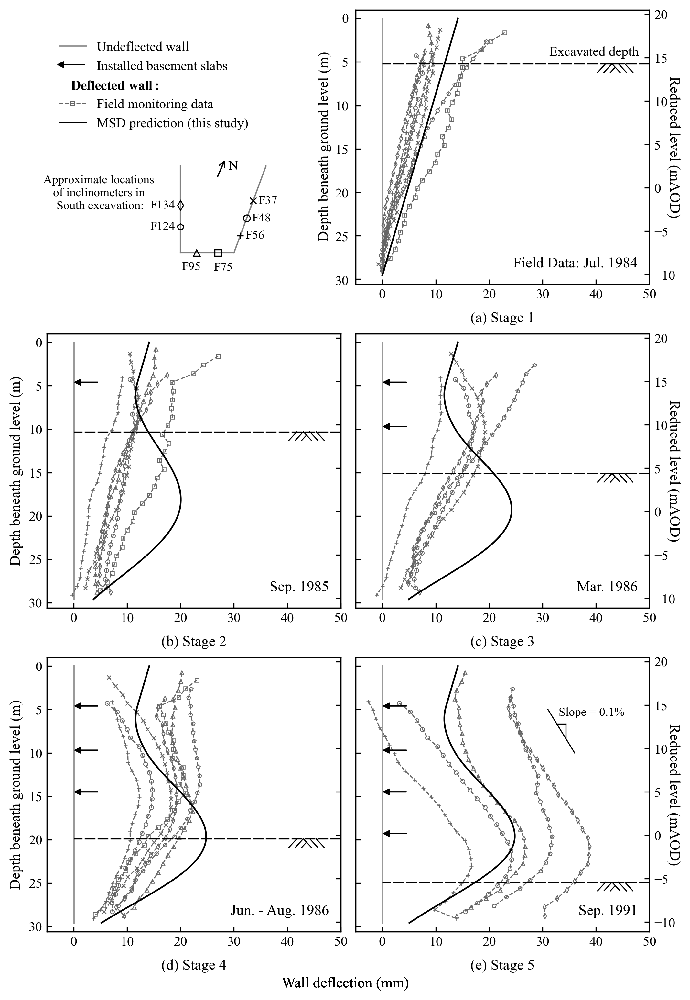

In [444]:
"""Plotting"""
fig, axs = plt.subplots(
    3,
    2,
    figsize=(7,10), 
    dpi=300, 
    sharey=False,
    sharex=False, 
    # squeeze=False, 
    constrained_layout=True
    )

rows,cols = np.shape(axs)
indices = np.indices((rows,cols)).transpose(1,2,0).reshape(1,rows*cols,2)[0]
axs_it = zip(axs.flatten(),range(0,rows*cols),indices)

lineprops = defaultdict(lambda: dict(color='k', ms=5, mew=.6, fillstyle='none'))
markerprops = defaultdict(lambda: dict(lw=.8, ls="--", color='0.4', marker='x', ms=3, mew=.6, fillstyle='none'))
markers = ['x', 'o', '+', 's', "^", "p", "d"]
for mark, inc in zip(markers, Inclonometers):
    markerprops[(inc)].update(marker=mark, mec='0.4')
    markerprops[(inc, "leg")].update(marker=mark, ms=5, color='k', mew=.8)

output = Paper_general_fig

maxvals = {}
maxdepths5 = {}
for (ax, pltno, (row,col)) in axs_it:
    plt.sca(ax)
    maxvals[pltno] = {}

    ## Plotting of Data #################################################################################################
    if pltno != 0:
        for inc in Disp:
            plot_df = Disp[inc].loc[:, Date_range[pltno]]
            if plot_df.empty:
                continue

            plot_df.iloc[:,0]
            y = (np.array(plot_df.index) - output.AOD)*-1
            x = np.array(plot_df.T)[0]
            
            if inc == "F37" or inc == "F48" or inc == "F56" or inc == "F75" or inc == "F95":
                x = x*-1

            maxvals[pltno][inc] = np.max(x)
            if pltno == 5:
                maxdepths5[inc] = y[np.nanargmax(x)]
            
            plt.plot(x,y, **markerprops[(inc)])


    ## Plotting of the MSD Method ##########################################################################################
    if pltno > 0:
        ## Current excavation level
        plt.plot([0,100], [output.Hm[pltno-1],]*2, **lineprops[()], ls=(2, (10,2)), lw=".8")
        excavation_level(output.Hm[pltno-1], 43, height=1, width=1.5, spacing=1.2)
        ## Pile Wall
        plt.plot([0,0], [0,output.L], color='0.6', lw=1.2, ls='-', zorder=0) # Pile wall
        ## Date Range labels
        plt.annotate(f'{Date_text[pltno]}', [0.96, 0.05], xycoords='axes fraction', ha='right', va='bottom', fontsize=lblfs+2) # Date labels

        ## Wall displacements
        # plt.plot(np.multiply(output.x_points_inc[pltno-1],1000), output.y_points, **lineprops[()], ls='--', lw="1.2") # Incremental bulding deflection
        plt.plot(np.multiply(output.x_points_total[pltno-1],1000), output.y_points, **lineprops[()], ls='-', lw="1.2") # Total bulging deflection
        if pltno == 5:
            maxvals_MSD5 = max(output.x_points_total[pltno-1])
            maxdepths_MSD5 = output.y_points[np.nanargmax(output.x_points_total[pltno-1])]

        ## Prop plotting
        arrow_loc = 0
    if pltno > 1:
        ax.annotate("", xy=(arrow_loc-0.5, output.Hp[1]), xytext=(arrow_loc+5, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color='k'))
    if pltno > 2:
        ax.annotate("", xy=(arrow_loc-0.5, output.Hp[2]), xytext=(arrow_loc+5, output.Hp[2]), arrowprops=dict(arrowstyle="-|>", color='k'))
    if pltno > 3:
        ax.annotate("", xy=(arrow_loc-0.5, output.Hp[3]), xytext=(arrow_loc+5, output.Hp[3]), arrowprops=dict(arrowstyle="-|>", color='k'))
    if pltno > 4:
        ax.annotate("", xy=(arrow_loc-0.5, output.Hp[4]), xytext=(arrow_loc+5, output.Hp[4]), arrowprops=dict(arrowstyle="-|>", color='k'))
        

    ## General formatting and axes labels ####################################################################################
    plt.ylim(output.L+1,0-1)
    plt.xlim(-5,50)
    if pltno == 2 or pltno == 4:
        plt.ylabel("Depth beneath ground level (m)", fontsize=axsfs)
    plt.figtext(0.5,0.0, "Wall deflection (mm)", ha="center", va="top", fontsize=axsfs)

    ## Plotting of gradient line
    if pltno == 5:
        grad([36,10], 0.1, 5)

    ## pltno 1 ylabel
    if pltno == 1:
        plt.figtext(0.48,0.855,"Depth beneath ground level (m)", ha="right", va="center", fontsize=axsfs, rotation=90)
        plt.figtext(0.505,0.992,"0",ha="right", va="top")
        plt.figtext(0.505,0.947,"5",ha="right", va="top")
        plt.figtext(0.505,0.902,"10",ha="right", va="top")
        plt.figtext(0.505,0.857,"15",ha="right", va="top")
        plt.figtext(0.505,0.812,"20",ha="right", va="top")
        plt.figtext(0.505,0.767,"25",ha="right", va="top")
        plt.figtext(0.505,0.722,"30",ha="right", va="top")
        plt.annotate("Excavated depth", [48, output.Hp[1]], ha="right", va="bottom", fontsize=lgdfs)

    ## Letter annotations
    if pltno != 0:
        plt.annotate(letter[pltno-1] + f' Stage {pltno}', [0.5,-0.1], xycoords='axes fraction', ha='center', va='top', fontsize=abfs)

        ## Secondary axis
        secax = ax.twinx()
        secax.set_ylim(output.AOD-output.L-1,output.AOD+1)
        if col == 1:
            ax.yaxis.set_ticklabels([])
            secax.set_ylabel("Reduced level (mAOD)\n", rotation=-90, fontsize=axsfs)
        if col == 0:
            secax.yaxis.set_ticklabels([])
    else:
        plt.axis("off")

        ## Legend
        plt.plot([np.NaN,np.NaN], [0,output.L], color="k", ls="", label=" ")
        plt.plot([np.NaN,np.NaN], [0,output.L], color='0.6', lw=1.2, ls='-', label="Undeflected wall")
        plt.plot([np.NaN,np.NaN], [0,output.L], color="k", ls="", label="Installed basement slabs")
        plt.plot([np.NaN,np.NaN], [0,output.L], color="k", ls="", label=" ")
        plt.plot([np.NaN,np.NaN], [0,output.L], **markerprops[("F75")], label="Field monitoring data")
        plt.plot([np.NaN,np.NaN], [0,output.L], **lineprops[()], lw="1.2", label="MSD prediction (this study)")
        plt.legend(frameon=False, loc="upper left", fontsize=lgdfs)
        ax.annotate("  ", xy=(-3.7, 5.3), xytext=(3, 5.3), arrowprops=dict(arrowstyle="-|>", color='k'), va='center', fontsize=lgdfs)
        # plt.annotate("$\mathbf{Current\ excavation:}$", [-0.5,1.5], ha="left", va="center", fontsize=lgdfs)
        plt.annotate("$\mathbf{Deflected\ wall:}$", [-0.5,7.8], ha="left", va="center", fontsize=lgdfs)

        ## Key
        key(17, 20, 18, 5)

plt.savefig(fig_file+"\Figure 1_v6.eps")

In [437]:
df_max = pd.DataFrame(maxvals)[[1, 5]]
display(df_max)
display(df_max.mean())
display(df_max.min())
display(df_max.max())
print(output.rot*1000)
print(maxvals_MSD5*1000)

,1,5
F37,10.795990,NaN
F48,7.800000,24.19250
F56,7.832998,16.68850
F75,22.900000,NaN
F95,9.200001,26.70999
F124,19.458760,31.76875
F134,7.950012,38.75000


1    12.276823
5    27.621948
dtype: float64

1     7.8000
5    16.6885
dtype: float64

1    22.90
5    38.75
dtype: float64

14.153522575174025
24.802641514652414


In [430]:
display(maxdepths5)
display("MSD max:", maxdepths_MSD5)
print("average field data:")
np.average([val for key, val in maxdepths5.items()])

{'F48': 22.280001,
 'F56': 23.1,
 'F95': 20.780001,
 'F124': 19.625,
 'F134': 20.780001}

'MSD max:'

19.733333333333334

average field data:


21.3130006

## Figure 2

In [445]:
Date_var_range = {
    1: { # Stage 1
        1: slice(datetime(1983, 8, 1), datetime(1983, 8, 10)), # Early date
        2: slice(datetime(1984, 7, 10), datetime(1984, 7, 23)), # Late date
    },
    5: { # Stage 5
        1: slice(datetime(1987, 9, 26), datetime(1988, 2, 28)), # Early date
        2: slice(datetime(1990, 10, 1), datetime(1991, 9, 30)), # Late date
    }
}

Date = {
    1: { # Stage 1
        1: "Aug. 1983",
        2: "Jul. 1984",
    },
    5: { # Stage 5
        1: "Sep. - Oct. 1987",
        2: "Sep. 1991",
    }
}

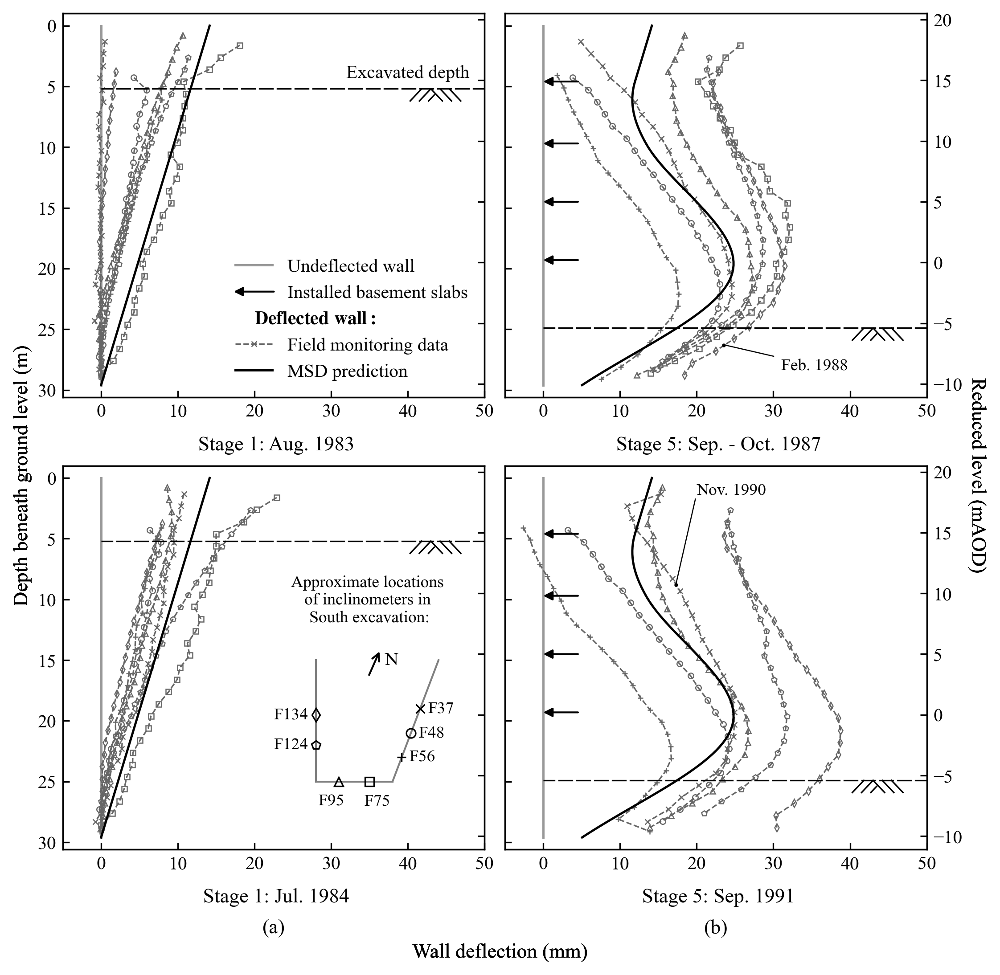

In [446]:
"""Plotting"""
fig, axs = plt.subplots(
    2,
    2,
    figsize=(7,7), 
    dpi=300, 
    sharey=True,
    sharex=False, 
    # squeeze=True, 
    constrained_layout=True,
    )

rows,cols = np.shape(axs)
indices = np.indices((rows,cols)).transpose(1,2,0).reshape(1,rows*cols,2)[0]
axs_it = zip(axs.flatten(),range(0,rows*cols),indices)

lineprops = defaultdict(lambda: dict(color='k', ms=5, mew=.6, fillstyle='none'))
markerprops = defaultdict(lambda: dict(lw=.8, ls="--", color='0.4', marker='x', ms=3, mew=.6, fillstyle='none'))
markers = ['x', 'o', '+', 's', "^", "p", "d"]
for mark, inc in zip(markers, Inclonometers):
    markerprops[(inc, 1)].update(marker=mark, mec='0.4')
    markerprops[(inc, 2)].update(marker=mark, mec='0.4')
    markerprops[(inc, "not matching")].update(marker=mark, mec='0.7', color="0.7")
    markerprops[(inc, "leg")].update(marker=mark, ms=5, color='k', mew=.8)

stage_no = [1,5]

output = Paper_general_fig

for (ax, pltno, (row,col)) in axs_it:
    plt.sca(ax)

    if row == 0:
        time = 1
    else:
        time = 2
    if col == 0:
        stage = 1
    else:
        stage = 5


    ## Plotting of Data #################################################################################################
    for inc in Disp:
        plot_df = Disp[inc].loc[:, Date_var_range[stage][time]]
        if plot_df.empty:
            continue
        y = (np.array(plot_df.index) - output.AOD)*-1
        if pltno != 3:
            x = np.array(plot_df.iloc[:,0])
        else:
            x = np.array(plot_df.iloc[:,-1].T)
        if inc == "F37" or inc == "F48" or inc == "F56" or inc == "F75" or inc == "F95":
            x = x*-1
        plt.plot(x,y, **markerprops[(inc, time)])

    if pltno == 1:
        ax.annotate("Feb. 1988", xy=(23, 26.2), xytext=(31, 28), arrowprops=dict(arrowstyle="-", color='k', lw=.6), va='center', fontsize=lblfs)
        plt.plot(23.5,26.3,"o", color="k", ms=1)
    if pltno == 3:
        ax.annotate("Nov. 1990", [20, 1], va='center', ha="left", fontsize=lblfs)
        ax.annotate(" ", xy=(17.2, 9), xytext=(20, 0.5), arrowprops=dict(arrowstyle="-", color='k', lw=.6), va='center', ha="left", fontsize=lblfs)
        plt.plot(17.3,8.8,"o", color="k", ms=1)


    ## Plotting of the MSD Method ##########################################################################################
    ## Current excavation level
    excavation_level(output.Hm[stage-1], 43, height=1, width=1.5, spacing=1.2)
    plt.plot([0,100], [output.Hm[stage-1],]*2, **lineprops[()], ls=(2, (10,2)), lw=".8")
    ## Pile wall
    plt.plot([0,0], [0,output.L], color='0.6', lw=1.2, ls='-', zorder=0)

    ## Rotation stages
    if col == 0:
        plt.plot(np.multiply(output.x_points_total[0],1000), output.y_points, **lineprops[()], lw=1.2)

    ## Stage 5
    if col == 1:
        plt.plot(np.multiply(output.x_points_total[stage-1],1000), output.y_points, **lineprops[()], ls='-', lw=1.2)
        ## prop annotation
        arrow_loc = 0
        ax.annotate("", xy=(arrow_loc-0.5, output.Hp[1]), xytext=(arrow_loc+5, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color='k'))
        ax.annotate("", xy=(arrow_loc-0.5, output.Hp[2]), xytext=(arrow_loc+5, output.Hp[2]), arrowprops=dict(arrowstyle="-|>", color='k'))
        ax.annotate("", xy=(arrow_loc-0.5, output.Hp[3]), xytext=(arrow_loc+5, output.Hp[3]), arrowprops=dict(arrowstyle="-|>", color='k'))
        ax.annotate("", xy=(arrow_loc-0.5, output.Hp[4]), xytext=(arrow_loc+5, output.Hp[4]), arrowprops=dict(arrowstyle="-|>", color='k'))
        
    ## Formatting ##############################################################################################################
    plt.ylim(output.L+1,0-1)
    plt.xlim(-5,50)
    plt.figtext(0, 0.5, "Depth beneath ground level (m)", ha="right", va="center", fontsize=axsfs, rotation=90)
    plt.figtext(1, 0.5, "Reduced level (mAOD)", ha="left", va="center", fontsize=axsfs, rotation=-90)
    plt.figtext(0.5,0, "Wall deflection (mm)", ha="center", va="top", fontsize=axsfs)

    ## Letter and stage labels
    if row != 0:
        plt.annotate(f' Stage {stage}: {Date[stage][time]}', [0.5,-0.1], xycoords='axes fraction', ha='center', va='top', fontsize=axsfs)
        plt.annotate(letter[pltno-2], [0.5,-0.18], xycoords='axes fraction', ha='center', va='top', fontsize=abfs)
    else:
        plt.annotate(f' Stage {stage}: {Date[stage][time]}', [0.5,-0.1], xycoords='axes fraction', ha='center', va='top', fontsize=axsfs)


    if pltno == 0:
        ## Legend
        plt.plot([np.NaN,np.NaN], [0,output.L], color="k", ls="", label=" ")
        plt.plot([np.NaN,np.NaN], [0,output.L], color='0.6', lw=1.2, ls='-', label="Undeflected wall")
        plt.plot([np.NaN,np.NaN], [0,output.L], color="k", ls="", label="Installed basement slabs")
        plt.plot([np.NaN,np.NaN], [0,output.L], color="k", ls="", label=" ")
        plt.plot([np.NaN,np.NaN], [0,output.L], **markerprops[("F75")], label="Field monitoring data")
        plt.plot([np.NaN,np.NaN], [0,output.L], **lineprops[()], lw=1.2, label="MSD prediction")
        plt.legend(frameon=False, loc="lower right", fontsize=lgdfs)
        ax.annotate("  ", xy=(16.8, 21.9), xytext=(23.5, 21.9), arrowprops=dict(arrowstyle="-|>", color='k'), va='center', fontsize=lgdfs)
        plt.annotate("$\mathbf{Deflected\ wall:}$", [20,24.2], ha="left", va="center", fontsize=lgdfs)
    if pltno == 2:
        ## key
        key(15, 28, 8, 35)
    if pltno == 0:
        plt.annotate("Excavated depth", [48, output.Hp[1]], ha="right", va="bottom", fontsize=lgdfs)

    ## Secondary axis
    secax = ax.twinx()
    secax.set_ylim(output.AOD-output.L-1,output.AOD+1)
    if col == 0:
        secax.yaxis.set_ticklabels([])

plt.savefig(fig_file+"\Figure 2_v4.eps")

## Figure 3

### b

b =  0.58
0.037427087665578264
b =  0.49
0.033219980219515735
b =  0.45
0.04204568723394565
b =  0.41
0.03004943949832906
b =  0.83
0.06331683170540701
b =  0.47
0.022183164883753544
b =  0.58
0.031132672631118352
b =  0.66
0.03423940638629057
b =  0.53
0.03005854506352158
b =  0.5
0.022492524884622913
b =  0.6
0.0494632440628901
b =  0.54
0.03517067347511573
b =  0.62
0.025968853912635658
b =  0.64
0.04655581850971248
b =  0.67
0.039980569397180074
b =  0.75
0.03824134804523754


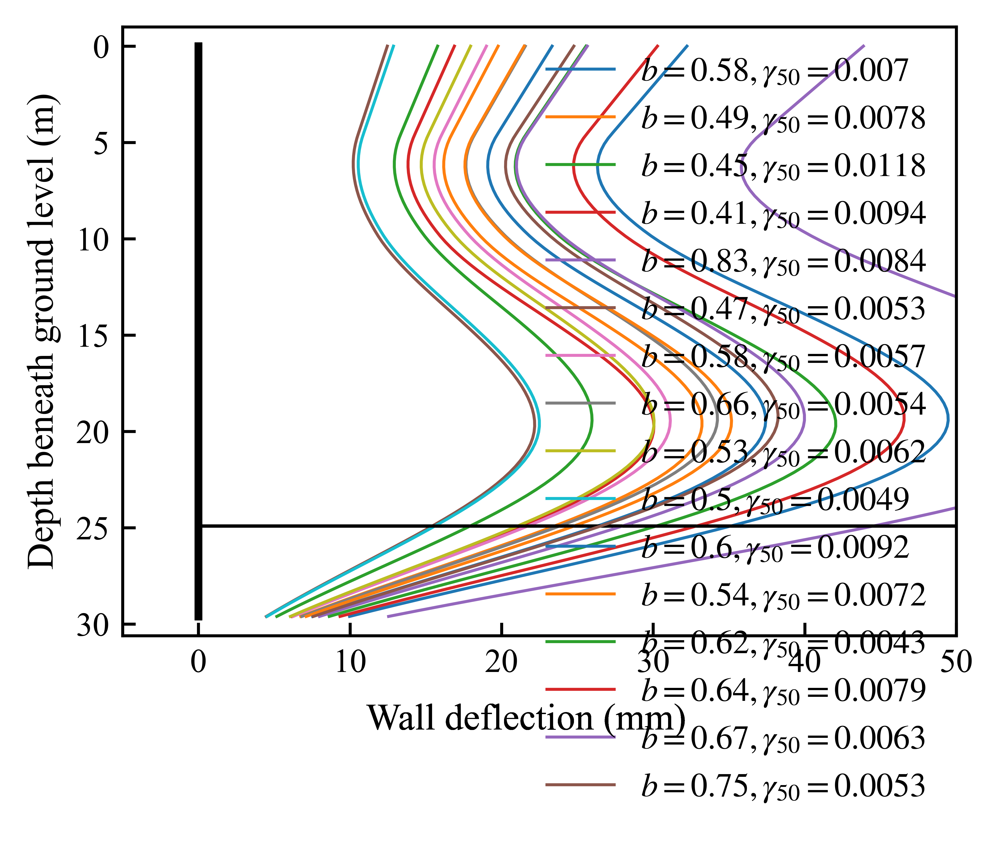

In [234]:
fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3), 
    dpi=1200, 
    sharey=False,
    sharex=True, 
    # squeeze=False, 
    constrained_layout=False
    )

lineprops = defaultdict(lambda: dict(lw=.8, ls="-", ms=5, mew=.6, fillstyle='none'))
linestyle = ["-"]
for bb, ls in zip(b_var, linestyle):
    lineprops[(bb)].update(ls="-")

stage = 5
plt.sca(ax)

for bb, g in zip(b_var,gamma_50_var):
    output = Paper_param_var[
        EI_standard,
        cu0_standard,
        cu_var_standard,
        alpha_standard,
        g,
        bb,
        gamma_sat_standard]

    ## Plotting of the MSD Method ##########################################################################################
    plt.plot([0,100], [output.Hm[stage-1],]*2, **lineprops[()], color="k") # Current excavation level
    plt.plot(np.multiply(output.x_points_total[stage-1],1000), output.y_points, **lineprops[(bb)], label=f"$b = {bb}, $" + r"$\gamma_{50} = $" + f"${g}$") # Total bulging deflection

    print("b = ", bb)
    print(max(output.x_points_total[stage-1]))

    plt.plot([0,0], [0,output.L], color='k', lw=2, ls='-') # Pile wall

    ## Formatting
    plt.ylim(output.L+1,0-1)
    plt.xlim(-5,50)
    plt.ylabel("Depth beneath ground level (m)", fontsize=axsfs)
    plt.figtext(0.5,0.02, "Wall deflection (mm)", ha="center", va="center", fontsize=axsfs)
    plt.legend(frameon=False)#, bbox_to_anchor=[1.2,0.25])

### gamma_50

$\gamma_{50} = $ 0.0043
0.01702290223491784
$\gamma_{50} = $ 0.007
0.027325082395325266
$\gamma_{50} = $ 0.0118
0.04496477049932582


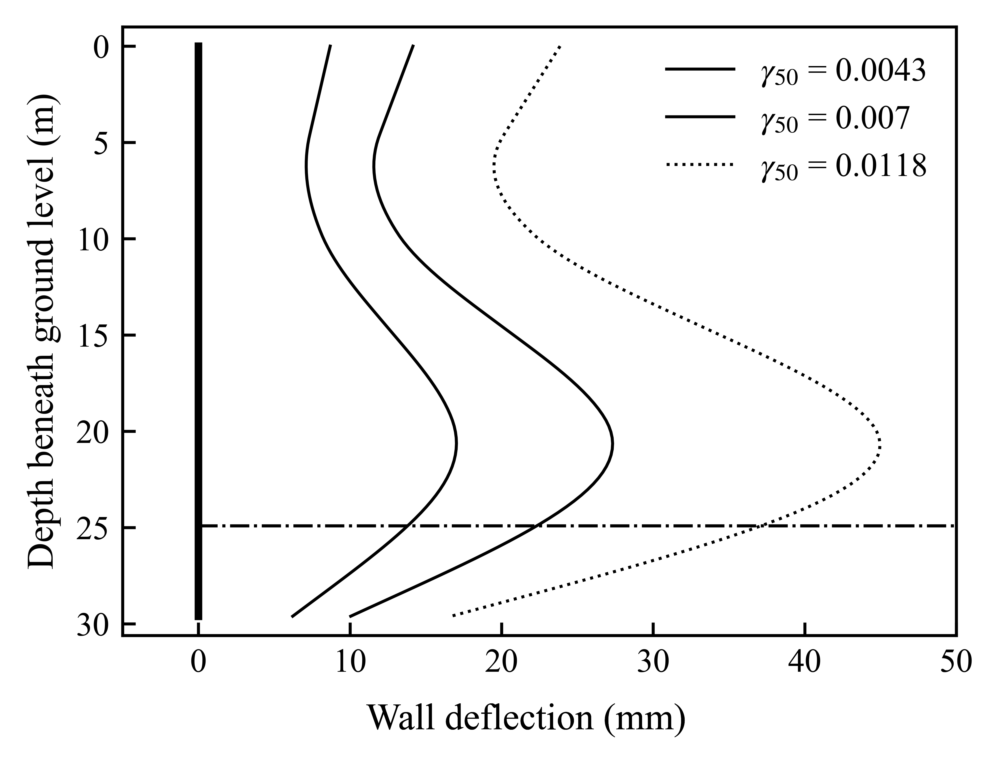

In [22]:
fig, axs = plt.subplots(
    1,
    1,
    figsize=(4,3), 
    dpi=1200, 
    sharey=False,
    sharex=True, 
    # squeeze=False, 
    constrained_layout=False
    )

lineprops = defaultdict(lambda: dict(lw=.8, ls="-.", color='k', ms=5, mew=.6, fillstyle='none'))
linestyle = ["-", "-", ":"]
for g, ls in zip(gamma_50_var, linestyle):
    lineprops[(g)].update(ls=ls)

stage = 5
plt.sca(axs)

for g in gamma_50_var:
    output = Paper_param_var[
        (conc_E*conc_I_crack)+(steel_E*steel_I),
        40,
        11,
        alpha_standard,
        g,
        0.58,
        20]

    ## Plotting of the MSD Method ##########################################################################################
    plt.plot([0,100], [output.Hm[stage-1],]*2, **lineprops[()]) # Current excavation level
    plt.plot(np.multiply(output.x_points_total[stage-1],1000), output.y_points, **lineprops[(g)], label="$\gamma_{50}$ = "f"{g}") # Total bulging deflection

    print(r"$\gamma_{50} = $", g)
    print(max(output.x_points_total[stage-1]))

    plt.plot([0,0], [0,output.L], color='k', lw=2, ls='-') # Pile wall

    ## Formatting
    plt.ylim(output.L+1,0-1)
    plt.xlim(-5,50)
    plt.ylabel("Depth beneath ground level (m)", fontsize=axsfs)
    plt.figtext(0.5,0.02, "Wall deflection (mm)", ha="center", va="center", fontsize=axsfs)
    plt.legend(frameon=False)

### gamma_sat

$\gamma_{sat} = $ 19
0.022771549072866555
$\gamma_{sat} = $ 20
0.02480323505134982
$\gamma_{sat} = $ 21
0.026901446310481327


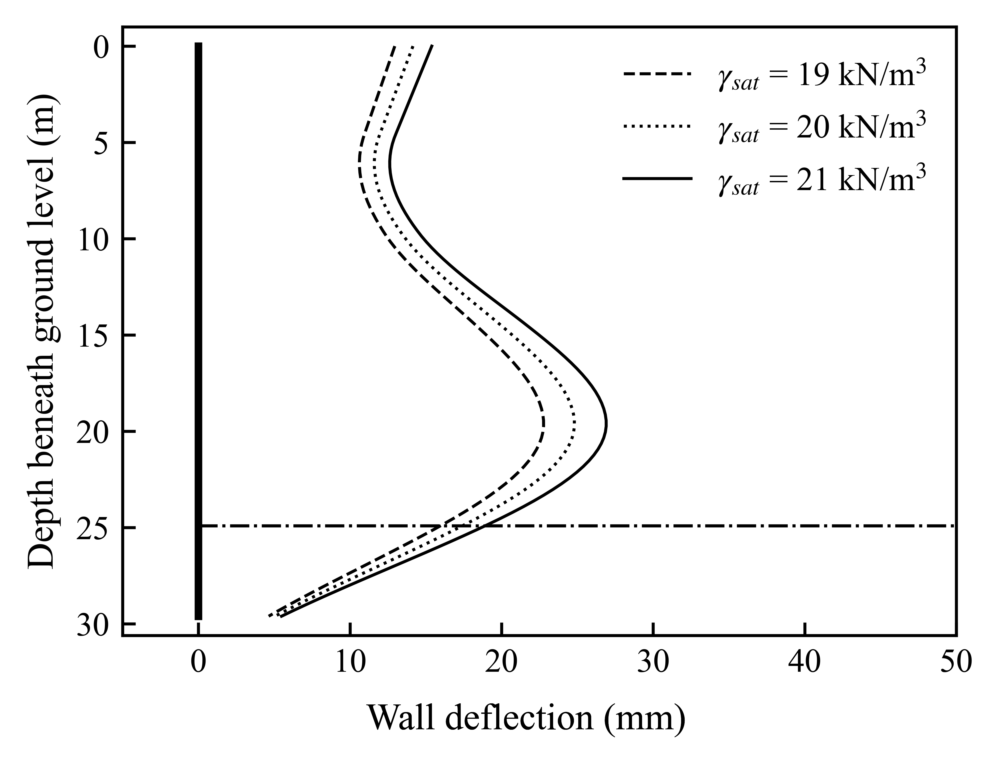

In [244]:
fig, axs = plt.subplots(
    1,
    1,
    figsize=(4,3), 
    dpi=1200, 
    sharey=False,
    sharex=True, 
    # squeeze=False, 
    constrained_layout=False
    )

lineprops = defaultdict(lambda: dict(lw=.8, ls="-.", color='k', ms=5, mew=.6, fillstyle='none'))
linestyle = ["--", ":", "-"]
for gs, ls in zip(gamma_sat_var, linestyle):
    lineprops[(gs)].update(ls=ls)

stage = 5
plt.sca(axs)

for gs in gamma_sat_var:
    output = Paper_param_var[
        EI_standard,
        40,
        11,
        alpha_standard,
        0.007,
        0.58,
        gs,
        ]

    ## Plotting of the MSD Method ##########################################################################################
    plt.plot([0,100], [output.Hm[stage-1],]*2, **lineprops[()]) # Current excavation level
    plt.plot(np.multiply(output.x_points_total[stage-1],1000), output.y_points, **lineprops[(gs)], label="$\gamma_{sat}$ = "f"{gs}" + " kN/m$^3$") # Total bulging deflection

    ## Prop plotting
    arrow_loc = np.interp(output.Hp[1], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[1]), xytext=(arrow_loc+5, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[2], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[2]), xytext=(arrow_loc+5, output.Hp[2]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[3], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[3]), xytext=(arrow_loc+5, output.Hp[3]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[4], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[4]), xytext=(arrow_loc+5, output.Hp[4]), arrowprops=dict(arrowstyle="-|>", color='k'))
        
    plt.plot([0,0], [0,output.L], color='k', lw=2, ls='-') # Pile wall

    print(r"$\gamma_{sat} = $", gs)
    print(max(output.x_points_total[stage-1]))

    ## Formatting
    plt.ylim(output.L+1,0-1)
    plt.xlim(-5,50)
    plt.ylabel("Depth beneath ground level (m)", fontsize=axsfs)
    plt.figtext(0.5,0.02, "Wall deflection (mm)", ha="center", va="center", fontsize=axsfs)
    plt.legend(frameon=False)

### cu

c_u =  24.8
0.022223935639056995
c_u =  40
0.027325082395325266
c_u =  39
0.03163942368674784


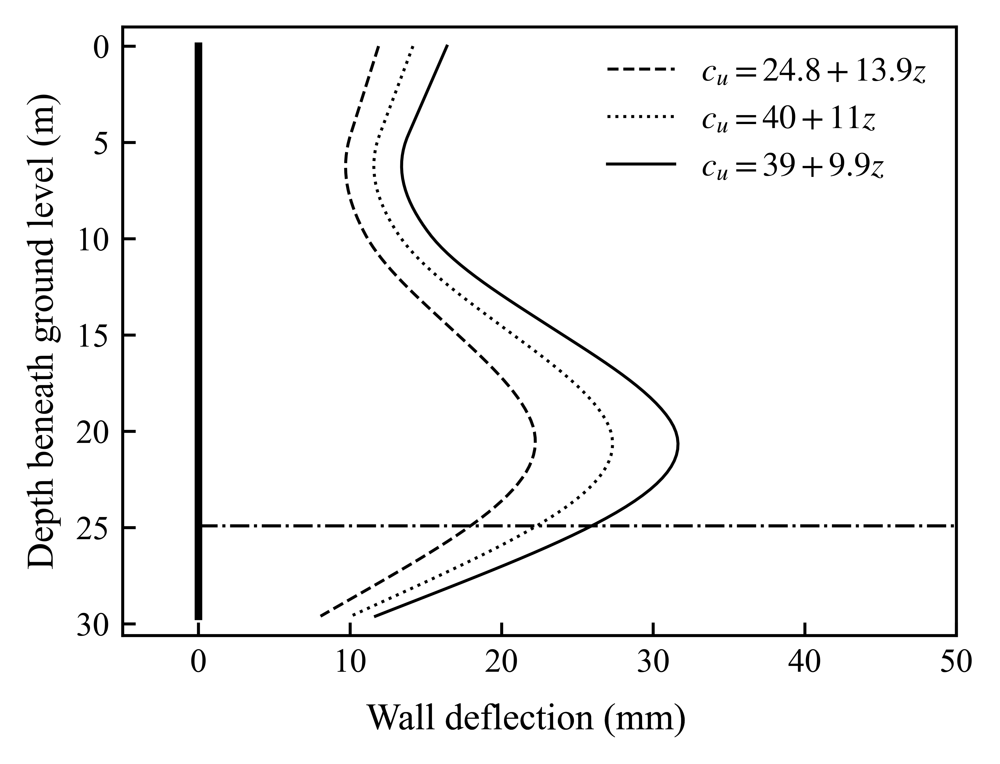

In [36]:
fig, axs = plt.subplots(
    1,
    1,
    figsize=(4,3), 
    dpi=1200, 
    sharey=False,
    sharex=True, 
    # squeeze=False, 
    constrained_layout=False
    )

lineprops = defaultdict(lambda: dict(lw=.8, ls="-.", color='k', ms=5, mew=.6, fillstyle='none'))
linestyle = ["--", ":", "-"]
for c, ls in zip(cu_var, linestyle):
    lineprops[(c)].update(ls=ls)

stage = 5
plt.sca(axs)

for c,v in zip(cu_var,cu_var_var):
    output = Paper_param_var[
        (conc_E*conc_I_crack)+(steel_E*steel_I),
        c,
        v,
        alpha_standard,
        0.007,
        0.58,
        20,
        ]

    ## Plotting of the MSD Method ##########################################################################################
    plt.plot([0,100], [output.Hm[stage-1],]*2, **lineprops[()]) # Current excavation level
    plt.plot(np.multiply(output.x_points_total[stage-1],1000), output.y_points, **lineprops[(c)], label=f"$c_u = {c} + {v}z$") # Total bulging deflection

    ## Prop plotting
    arrow_loc = np.interp(output.Hp[1], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[1]), xytext=(arrow_loc+5, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[2], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[2]), xytext=(arrow_loc+5, output.Hp[2]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[3], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[3]), xytext=(arrow_loc+5, output.Hp[3]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[4], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[4]), xytext=(arrow_loc+5, output.Hp[4]), arrowprops=dict(arrowstyle="-|>", color='k'))
        
    plt.plot([0,0], [0,output.L], color='k', lw=2, ls='-') # Pile wall

    print("c_u = ", c)
    print(max(output.x_points_total[stage-1]))

    ## Formatting
    plt.ylim(output.L+1,0-1)
    plt.xlim(-5,50)
    plt.ylabel("Depth beneath ground level (m)", fontsize=axsfs)
    plt.figtext(0.5,0.02, "Wall deflection (mm)", ha="center", va="center", fontsize=axsfs)
    plt.legend(frameon=False)

### EI

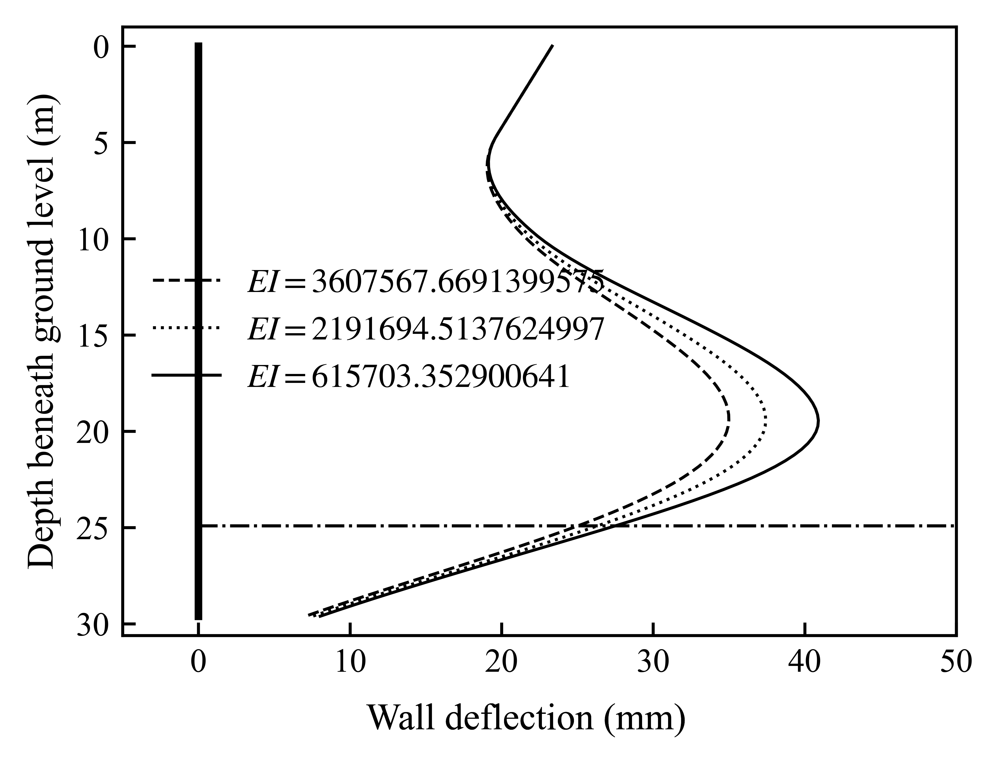

In [229]:
fig, axs = plt.subplots(
    1,
    1,
    figsize=(4,3), 
    dpi=1200, 
    sharey=False,
    sharex=True, 
    # squeeze=False, 
    constrained_layout=False
    )

lineprops = defaultdict(lambda: dict(lw=.8, ls="-.", color='k', ms=5, mew=.6, fillstyle='none'))
linestyle = ["--", ":", "-"]
for ei, ls in zip(EI_var, linestyle):
    lineprops[(ei)].update(ls=ls)

stage = 5
plt.sca(axs)

for ei in EI_var:
    output = Paper_param_var[
        ei,
        cu0_standard,
        cu_var_standard,
        alpha_standard,
        0.007,
        0.58,
        20,
        ]

    ## Plotting of the MSD Method ##########################################################################################
    plt.plot([0,100], [output.Hm[stage-1],]*2, **lineprops[()]) # Current excavation level
    plt.plot(np.multiply(output.x_points_total[stage-1],1000), output.y_points, **lineprops[(ei)], label=f"$EI = {ei}$") # Total bulging deflection

    ## Prop plotting
    arrow_loc = np.interp(output.Hp[1], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[1]), xytext=(arrow_loc+5, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[2], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[2]), xytext=(arrow_loc+5, output.Hp[2]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[3], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[3]), xytext=(arrow_loc+5, output.Hp[3]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[4], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[4]), xytext=(arrow_loc+5, output.Hp[4]), arrowprops=dict(arrowstyle="-|>", color='k'))
        
    plt.plot([0,0], [0,output.L], color='k', lw=2, ls='-') # Pile wall

    ## Formatting
    plt.ylim(output.L+1,0-1)
    plt.xlim(-5,50)
    plt.ylabel("Depth beneath ground level (m)", fontsize=axsfs)
    plt.figtext(0.5,0.02, "Wall deflection (mm)", ha="center", va="center", fontsize=axsfs)
    plt.legend(frameon=False)

### Alpha

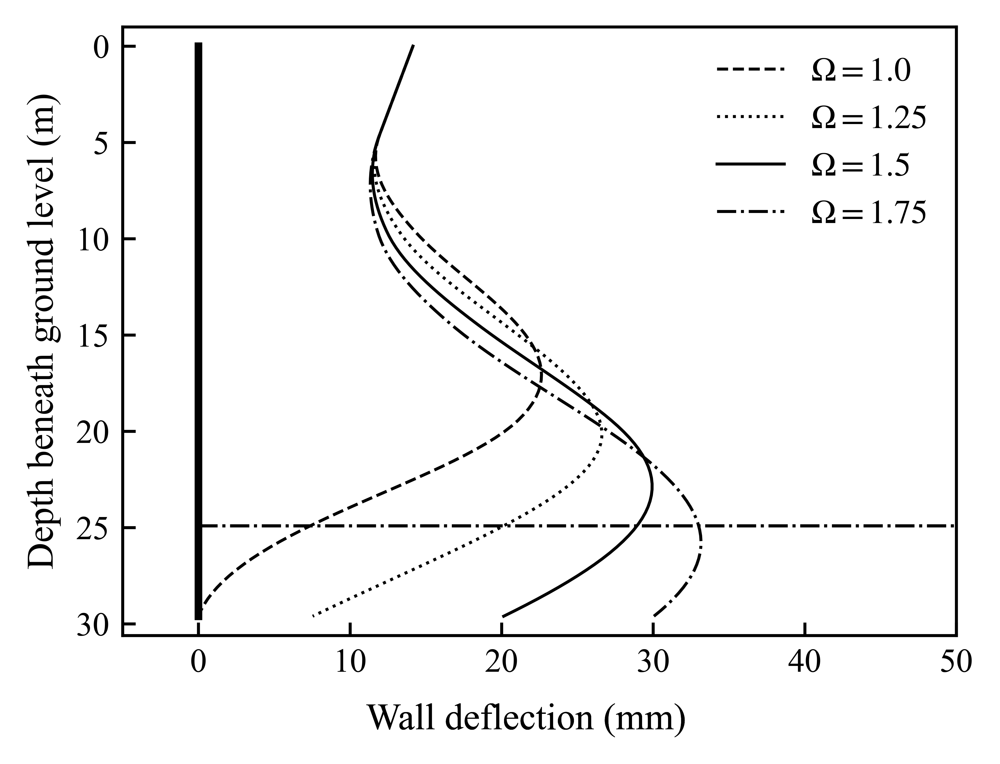

In [26]:
fig, axs = plt.subplots(
    1,
    1,
    figsize=(4,3), 
    dpi=1200, 
    sharey=False,
    sharex=True, 
    # squeeze=False, 
    constrained_layout=False
    )

lineprops = defaultdict(lambda: dict(lw=.8, ls="-.", color='k', ms=5, mew=.6, fillstyle='none'))
linestyle = ["--", ":", "-", "-."]
for a, ls in zip(alpha_var, linestyle):
    lineprops[(a)].update(ls=ls)

stage = 5
plt.sca(axs)

for a in alpha_var:
    output = Paper_param_var[
        (conc_E*conc_I_crack)+(steel_E*steel_I),
        40,
        11,
        a,
        0.007,
        0.58,
        20,
        ]

    ## Plotting of the MSD Method ##########################################################################################
    plt.plot([0,100], [output.Hm[stage-1],]*2, **lineprops[()]) # Current excavation level
    plt.plot(np.multiply(output.x_points_total[stage-1],1000), output.y_points, **lineprops[(a)], label="$\alpha_s = "f"{a}$") # Total bulging deflection

    ## Prop plotting
    arrow_loc = np.interp(output.Hp[1], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[1]), xytext=(arrow_loc+5, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[2], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[2]), xytext=(arrow_loc+5, output.Hp[2]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[3], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[3]), xytext=(arrow_loc+5, output.Hp[3]), arrowprops=dict(arrowstyle="-|>", color='k'))
    arrow_loc = np.interp(output.Hp[4], output.y_points, np.multiply(output.x_points_total[stage-1],1000))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[4]), xytext=(arrow_loc+5, output.Hp[4]), arrowprops=dict(arrowstyle="-|>", color='k'))
        
    plt.plot([0,0], [0,output.L], color='k', lw=2, ls='-') # Pile wall

    ## Formatting
    plt.ylim(output.L+1,0-1)
    plt.xlim(-5,50)
    plt.ylabel("Depth beneath ground level (m)", fontsize=axsfs)
    plt.figtext(0.5,0.02, "Wall deflection (mm)", ha="center", va="center", fontsize=axsfs)
    plt.legend(frameon=False)

### Figure 3

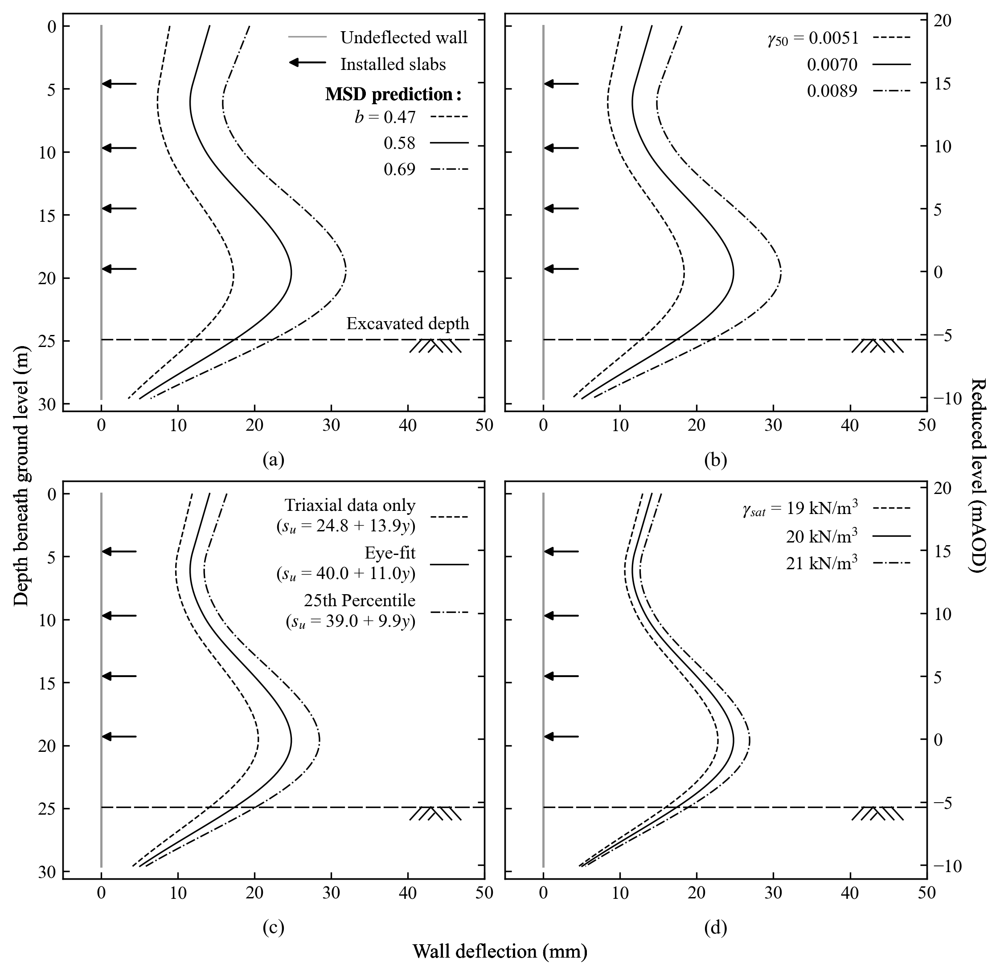

In [447]:
fig, axs = plt.subplots(
    2,
    2,
    figsize=(7,7), 
    dpi=300, 
    sharey=False,
    sharex=False, 
    # squeeze=False, 
    constrained_layout=True,
    )

rows,cols = np.shape(axs)
indices = np.indices((rows,cols)).transpose(1,2,0).reshape(1,rows*cols,2)[0]
axs_it = zip(axs.flatten(),range(0,rows*cols),indices)

Data = {
    r"$b$": b_var,
    r"$\gamma_{50}$": gamma_50_var,
    r"$s_u$": cu_var,
    r"$\gamma_{sat}$": gamma_sat_var,
}

lineprops = defaultdict(lambda: dict(color='k', ms=5, mew=.6, fillstyle='none'))
linestyle = ["--", "-", "-."]

for (ax, pltno, (row,col)), var in zip(axs_it, Data):
    plt.sca(ax)

    ## Current excavation level
    plt.plot([0,100], [output.Hm[4],]*2, **lineprops[()], ls=(2, (10,2)), lw=".8")
    excavation_level(output.Hm[4], 43, height=1, width=1.5, spacing=1.2)
    ## Pile wall
    plt.plot([0,0], [0,output.L], color='0.6', lw=1.2, ls='-', zorder=0)
    ## Prop levels
    arrow_loc = 0
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[1]), xytext=(arrow_loc+5, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color='k'))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[2]), xytext=(arrow_loc+5, output.Hp[2]), arrowprops=dict(arrowstyle="-|>", color='k'))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[3]), xytext=(arrow_loc+5, output.Hp[3]), arrowprops=dict(arrowstyle="-|>", color='k'))
    ax.annotate("", xy=(arrow_loc-0.5, output.Hp[4]), xytext=(arrow_loc+5, output.Hp[4]), arrowprops=dict(arrowstyle="-|>", color='k'))


    count = -1
    start = var + " = "
    lines1 = []
    for ls, parameter in zip(linestyle, Data[var]):
        lineprops[(parameter)].update(ls=ls)
        count += 1
        if var == "$b$":
            output = Paper_param_var[EI_standard,cu0_standard,cu_var_standard,alpha_lamb_standard,gamma_50_standard,parameter,gamma_sat_standard]
            lines1 += plt.plot(np.multiply(output.x_points_total[4],1000), output.y_points, **lineprops[(parameter)],lw=0.8, label=start + str(format(parameter, ".2f")))
            # leg1 = plt.legend(lines1[0:], [start+f"{b_var[0]:.2f}"+r" $(-1\sigma)$", f"{b_var[1]:.2f}"+r" (Mean)", f"{b_var[2]:.2f}"+r" $(+1\sigma)$"], frameon=False, markerfirst=False, bbox_to_anchor=[1,0.8])
            leg1 = plt.legend(lines1[0:], [start+f"{b_var[0]:.2f}", f"{b_var[1]:.2f}", f"{b_var[2]:.2f}"], frameon=False, markerfirst=False, bbox_to_anchor=[1,0.8])
            plt.annotate(r"$\mathbf{MSD\ prediction:}$", [47,5.5], fontsize=lgdfs, va="center", ha="right")
        elif var == r"$\gamma_{50}$":
            output = Paper_param_var[EI_standard,cu0_standard,cu_var_standard,alpha_lamb_standard,parameter,b_standard,gamma_sat_standard]
            lines1 += plt.plot(np.multiply(output.x_points_total[4],1000), output.y_points, **lineprops[(parameter)],lw=0.8, label=start + str(format(parameter, ".4f")))
            start = ""
            # leg1 = plt.legend(lines1[0:], [start+f"{gamma_50_var[0]:.4f}"+r" $(-1\sigma)$", f"{gamma_50_var[1]:.4f}"+r" (Mean)", f"{gamma_50_var[2]:.4f}"+r" $(+1\sigma)$"], frameon=False, markerfirst=False, loc="upper right")
        elif var == "$s_u$":
            output = Paper_param_var[EI_standard,parameter,cu_var_var[count],alpha_lamb_standard,gamma_50_standard,b_standard,gamma_sat_standard]
            lines1 += plt.plot(np.multiply(output.x_points_total[4],1000), output.y_points, **lineprops[(parameter)],lw=0.8, label=start + str(format(parameter, ".1f")) + " + " + str(format(cu_var_var[count],".1f")) + "$y$ kPa")
            leg1 = plt.legend(lines1[0:], ["Triaxial data only\n(" + start+f"{cu_var[0]:.1f} + {cu_var_var[0]:.1f}$y$)", "Eye-fit\n(" + start+f"{cu_var[1]:.1f} + {cu_var_var[1]:.1f}$y$)", "25th Percentile\n(" + start+f"{cu_var[2]:.1f} + {cu_var_var[2]:.1f}$y$)"], frameon=False, markerfirst=False, loc="upper right")
            for t in leg1.get_texts():
                t.set_ha("right")
        elif var == r"$\gamma_{sat}$":
            output = Paper_param_var[EI_standard,cu0_standard,cu_var_standard,alpha_lamb_standard,gamma_50_standard,b_standard,parameter]
            plt.plot(np.multiply(output.x_points_total[4],1000), output.y_points, **lineprops[(parameter)],lw=0.8, label=start + str(format(parameter, ".0f")) + " kN/m$^3$")
            start = ""
    
    ## Formatting ######################################################################################################################
    plt.ylim(output.L+1,0-1)
    plt.xlim(-5,50)
    plt.figtext(0,0.5,"Depth beneath ground level (m)", ha="right", va="center", fontsize=axsfs, rotation=90)
    plt.figtext(0.5,0, "Wall deflection (mm)", ha="center", va="top", fontsize=axsfs)
    plt.figtext(1, 0.5, "Reduced level (mAOD)", ha="left", va="center", fontsize=axsfs, rotation=-90)
    plt.legend(frameon=False, loc="upper right", markerfirst=False) if pltno != 0 and pltno != 2 else ""
        
    plt.annotate(letter[pltno], [0.5,-0.1], xycoords='axes fraction', ha='center', va='top', fontsize=abfs)

    ## Legend
    lines = []
    if pltno == 0:
        # plt.plot([np.NaN,np.NaN], [0,output.L], color="k", ls="", label=" ")
        lines += plt.plot([np.NaN,np.NaN], [0,output.L], color='0.6', lw=0.8, ls='-', label="Undeflected wall")
        lines += plt.plot([np.NaN,np.NaN], [0,output.L], color="k", ls="", label="Installed slabs")
        plt.legend(lines[0:], ["Undeflected wall", "Installed slabs"], frameon=False, loc="upper right")
        ax.annotate("  ", xy=(23.9, 2.9), xytext=(30.2, 2.9), arrowprops=dict(arrowstyle="-|>", color='k'), va='center', fontsize=lgdfs)
        ax.add_artist(leg1)
        plt.annotate("Excavated depth", [48, output.Hm[4]-0.5], ha="right", va="bottom", fontsize=lgdfs)

    ## Secondary axis
    secax = ax.twinx()
    secax.set_ylim(output.AOD-output.L-1,output.AOD+1)
    if col == 1:
        ax.yaxis.set_ticklabels([])
    if col == 0:
        secax.yaxis.set_ticklabels([])


plt.savefig(fig_file+"\Figure 3_v5.eps")

## Figure 4

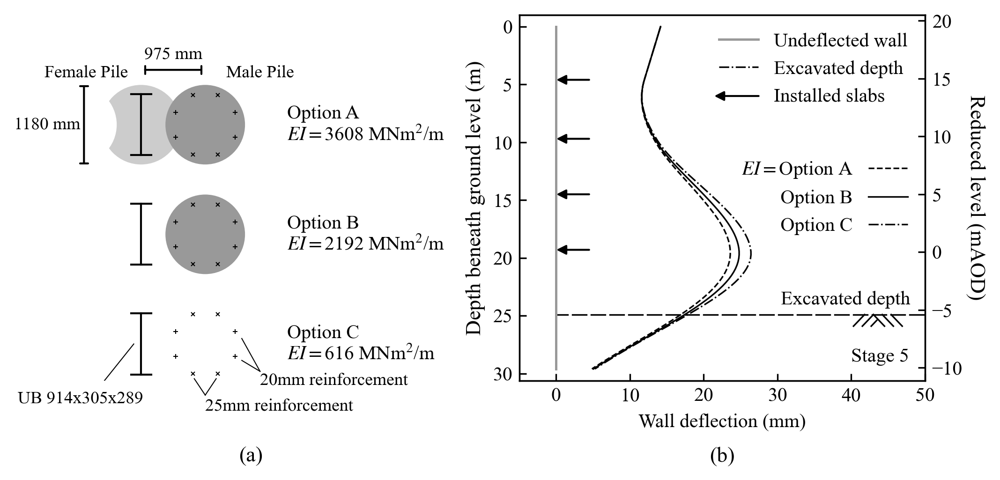

In [448]:
fig, axs = plt.subplots(
    1,
    2,
    figsize=(7,3.3), 
    dpi=300, 
    sharey=False,
    sharex=False, 
    squeeze=False, 
    constrained_layout=True,
    )

rows,cols = [1,2]#np.shape(axs)
indices = np.indices((rows,cols)).transpose(1,2,0).reshape(1,rows*cols,2)[0]
axs_it = zip(axs.flatten(),range(0,rows*cols),indices)

col2 = ".4"
col3 = ".6"
lineprops = defaultdict(lambda: dict(lw=.8, color='k', ms=5, mew=.6, fillstyle='none'))
linestyle = ["--", "-", "-.", (2, (10,2))]
for ls, ei in zip(linestyle, EI_var):
        lineprops[(ei)].update(ls=ls)
        lineprops[(ei, "below")].update(ls=ls, color=col2)

for (ax, pltno, (row,col)) in axs_it:
    plt.sca(ax)

    if row == 0:
        plt.annotate(letter[pltno], [0.5,-0.18], xycoords='axes fraction', ha='center', va='top', fontsize=abfs)
    else:
        plt.annotate(letter[pltno], [0.5,-0.18], xycoords='axes fraction', ha='center', va='top', fontsize=abfs)

    ## Effect of EI ###########################################################################################################
    if col == 1:
        ## Current excavation level
        plt.plot([0,100], [output.Hm[4],]*2, **lineprops[()], ls=(2, (10,2)))
        excavation_level(output.Hm[4], 43, height=1, width=1.5, spacing=1.2)
        ## Pile wall
        plt.plot([0,0], [0,output.L], color='0.6', lw=1.2, ls='-')
        ## Prop locations
        ax.annotate("", xy=(0-0.5, output.Hp[1]), xytext=(0+5, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color='k'))
        ax.annotate("", xy=(0-0.5, output.Hp[2]), xytext=(0+5, output.Hp[2]), arrowprops=dict(arrowstyle="-|>", color='k'))
        ax.annotate("", xy=(0-0.5, output.Hp[3]), xytext=(0+5, output.Hp[3]), arrowprops=dict(arrowstyle="-|>", color='k'))
        ax.annotate("", xy=(0-0.5, output.Hp[4]), xytext=(0+5, output.Hp[4]), arrowprops=dict(arrowstyle="-|>", color='k'))

        ## MSD Predicted results
        start = "$EI = $"
        for ei, option in zip(EI_var, ["A", "B", "C"]):
            output = Paper_param_var[ei,cu0_standard,cu_var_standard,alpha_lamb_standard,gamma_50_standard,b_standard,gamma_sat_standard]
            plt.plot(np.multiply(output.x_points_total[4],1000), output.y_points, **lineprops[(ei)], label=start + "Option " + option)
            start = " "
        leg1 = plt.legend(frameon=False, loc="center right", markerfirst=False)

        ## Legend
        lines = []
        lines += plt.plot([np.NaN,np.NaN], [0,output.L], color='0.6', lw=1.2, ls='-', label="Undeflected wall")
        lines += plt.plot([np.NaN,np.NaN], [0,output.L], **lineprops[()], ls="-.", label="Excavated depth")
        lines += plt.plot([np.NaN,np.NaN], [0,output.L], color="k", ls="", label="Installed slabs")
        plt.legend(lines[0:], ["Undeflected wall", "Excavated depth", "Installed slabs"], frameon=False, loc="upper right")
        ax.annotate("  ", xy=(20.9, 6), xytext=(28.5, 6), arrowprops=dict(arrowstyle="-|>", color='k'), va='center', fontsize=lgdfs)
        ax.add_artist(leg1)
        
        ## Formatting
        plt.ylim(output.L+1,0-1)
        plt.xlim(-5,50)
        plt.ylabel("Depth beneath ground level (m)", fontsize=axsfs)
        plt.xlabel(f"Wall deflection (mm)")
        plt.annotate("Stage 5", [0.96,0.04], ha="right", va="bottom", xycoords="axes fraction", fontsize=lblfs+1)
        plt.annotate("Excavated depth", [48, output.Hm[4]-0.5], ha="right", va="bottom", fontsize=lgdfs)

        ## Secondary axis
        secax = ax.twinx()
        secax.set_ylim(output.AOD-output.L-1,output.AOD+1)
        plt.annotate("Reduced level (mAOD)", [1.15, 0.5], ha="right", va="center", xycoords="axes fraction", fontsize=axsfs, rotation=-90)

    ## EI Option ##########################################################################################################################
    if pltno == 0:
        center = [0.1,0.4,0.7] # Ratio of center of three options
        left = 0.2 # Location of Center of left pile
        scale = 1.8 # Scale drawing

        I_beam = 0.0926*scale # Height of I beam
        I_beam_width = 0.0307*scale # Width of I beam
        diam = 0.118*scale # Diameter of pile
        c_to_c = 0.195/2*scale # Ceneter to center between female and male pile

        for c, option, ei in zip(center, ["C", "B", "A"], np.flip(EI_var)):
            ## Steel
            plt.plot([left,]*2, [c-I_beam/2,c+I_beam/2], color='k', lw=1)
            plt.plot([left-I_beam_width/2, left+I_beam_width/2], [c+I_beam/2,]*2, color='k', lw=1)
            plt.plot([left-I_beam_width/2, left+I_beam_width/2], [c-I_beam/2,]*2, color='k', lw=1)
            plt.plot([left+0.0522*scale,]*2, [c+0.0187*scale, c-0.0187*scale], ls="", color="k", ms=2.2, marker="+", mew=.5)
            plt.plot([left+0.1431*scale,]*2, [c+0.0187*scale, c-0.0187*scale], ls="", color="k", ms=2.2, marker="+", mew=.5)
            plt.plot([left+0.0787*scale,]*2, [c+0.0452*scale, c-0.0452*scale], ls="", color="k", ms=2, marker="x", mew=.5)
            plt.plot([left+0.1163*scale,]*2, [c+0.0452*scale, c-0.0452*scale], ls="", color="k", ms=2, marker="x", mew=.5)

            plt.annotate("Option " + option + "\n$EI = $" + str(int(np.round(ei,-3)/1000)) + " MNm$^2$/m", [left+0.4,c], ha="left", va="center", fontsize=lblfs+1)
        
        ax.add_artist(plt.Circle((left+c_to_c, center[1]), diam/2, color='.6'))
        ax.add_artist(plt.Circle((left, center[2]), diam/2, color='.8'))
        ax.add_artist(plt.Circle((left+c_to_c, center[2]), diam/2, color='.6'))
        ax.add_artist(plt.Circle((left-c_to_c, center[2]), diam/2, color='w'))

        plt.annotate("Female Pile", [left-0.15, center[2]+0.12], ha="center", va="bottom", fontsize=lblfs)
        plt.annotate("Male Pile", [left+c_to_c+0.15, center[2]+0.12], ha="center", va="bottom", fontsize=lblfs)
        plt.annotate("", xy=(left, center[2]+0.15), xytext=(left+c_to_c, center[2]+0.15), arrowprops=dict(arrowstyle="|-|", color='k', mutation_scale=2))
        plt.annotate("975 mm", [left+c_to_c/2,center[2]+0.17], ha="center", va="bottom", fontsize=lblfs)
        plt.annotate("", xy=(left-diam/2-0.05, center[2]+diam/2+0.01), xytext=(left-diam/2-0.05, center[2]-diam/2-0.01), arrowprops=dict(arrowstyle="|-|", color='k', mutation_scale=2))
        plt.annotate("1180 mm", [left-diam/2-0.06,center[2]], ha="right", va="center", fontsize=lblfs, clip_on=False)

        plt.annotate("UB 914x305x289", [left-diam/2-0.06,center[0]-0.15], ha="center", va="center", fontsize=lblfs, annotation_clip=False)
        plt.plot([0.1,0.18], [0.0,0.1], color='k', lw=.5)
        plt.plot([left+c_to_c,left+c_to_c+0.03], [-0.04,0.005], color='k', lw=.5, clip_on=False)
        plt.plot([left+c_to_c,left+c_to_c-0.03], [-0.04,0.005], color='k', lw=.5, clip_on=False)
        plt.text(left+c_to_c,center[0]-0.17, "25mm reinforcement", ha="left", va="center", fontsize=lblfs, clip_on=False)
        plt.plot([left+c_to_c+0.15,left+c_to_c+0.15-0.05], [0.025,0.055], color='k', lw=.5, clip_on=False)
        plt.plot([left+c_to_c+0.15,left+c_to_c+0.15-0.05], [0.025,0.115], color='k', lw=.5, clip_on=False)
        plt.text(left+c_to_c+0.15,center[0]-0.1, "20mm reinforcement", ha="left", va="center", fontsize=lblfs, clip_on=False)

        plt.xlim(0,1)
        plt.ylim(0,1)
        plt.axis("off")
        ax.set_aspect(1)

plt.savefig(fig_file+"\Figure 4_v5.eps")

## Figure 5

In [449]:
## Alpha Data

def alpha_data(stage_val, range_val, output):
    x_data = []
    y_data = np.linspace(0, output.L*2,1000)

    for y in y_data:
        inc_x_val = 0
        for m in range(1,stage_val):
            inc_x_val += 1/2*(1-np.cos(2*np.pi*(y-output.Hp[m])/output.lamb[m]))*output.delta[m]
        if y > range_val[1] or y < range_val[0]:
            x_data.append(np.NaN)
        else:
            x_data.append(inc_x_val)
    return x_data, y_data

C:\Users\ab16781\AppData\Local\Temp\ipykernel_25588\2172028057.py:126: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.savefig(fig_file+"\Figure 5_v2.eps")


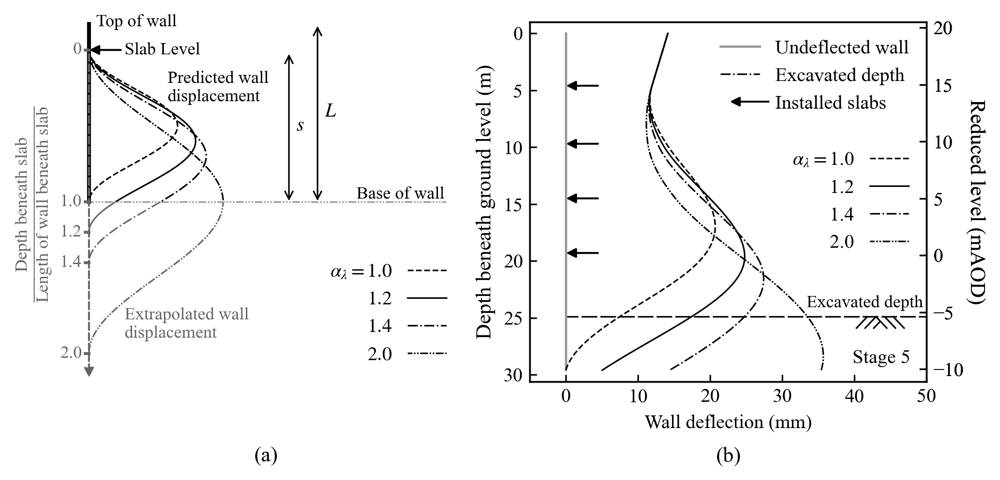

In [450]:
fig, axs = plt.subplots(
    1,
    2,
    figsize=(7,3.3), 
    dpi=300, 
    sharey=False,
    sharex=False, 
    squeeze=False, 
    constrained_layout=True,
    )

rows,cols = [1,2]#np.shape(axs)
indices = np.indices((rows,cols)).transpose(1,2,0).reshape(1,rows*cols,2)[0]
axs_it = zip(axs.flatten(),range(0,rows*cols),indices)

col2 = ".4"
col3 = ".6"
lineprops = defaultdict(lambda: dict(lw=.8, color='k', ms=5, mew=.6, fillstyle='none'))
linestyle = ["--", "-", "-.", (2,(5,1,1,1,1,1))]
for ls, a in zip(linestyle, alpha_lamb_var):
        lineprops[(a)].update(ls=ls)
        lineprops[(a, "below")].update(ls=ls, color=col2)

for (ax, pltno, (row,col)) in axs_it:
    plt.sca(ax)
    
    if row == 0:
        plt.annotate(letter[pltno], [0.5,-0.18], xycoords='axes fraction', ha='center', va='top', fontsize=abfs)
    else:
        plt.annotate(letter[pltno], [0.5,-0.18], xycoords='axes fraction', ha='center', va='top', fontsize=abfs)


    if col == 1:
        ## Current excavation level
        plt.plot([0,100], [output.Hm[4],]*2, **lineprops[()], ls=(2, (10,2)))
        excavation_level(output.Hm[4], 43, height=1, width=1.5, spacing=1.2)
        ## Pile wall
        plt.plot([0,0], [0,output.L], color='0.6', lw=1.2, ls='-')
        ## Prop locations
        ax.annotate("", xy=(0-0.5, output.Hp[1]), xytext=(0+5, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color='k'))
        ax.annotate("", xy=(0-0.5, output.Hp[2]), xytext=(0+5, output.Hp[2]), arrowprops=dict(arrowstyle="-|>", color='k'))
        ax.annotate("", xy=(0-0.5, output.Hp[3]), xytext=(0+5, output.Hp[3]), arrowprops=dict(arrowstyle="-|>", color='k'))
        ax.annotate("", xy=(0-0.5, output.Hp[4]), xytext=(0+5, output.Hp[4]), arrowprops=dict(arrowstyle="-|>", color='k'))

        ## MSD Predicted results
        start = r"$\alpha_{\lambda} = $"
        for a in alpha_lamb_var:
            output = Paper_param_var[EI_standard,cu0_standard,cu_var_standard,a,gamma_50_standard,b_standard,gamma_sat_standard]
            plt.plot(np.multiply(output.x_points_total[4],1000), output.y_points, **lineprops[(a)], label=start + str(a))
            start = " "
        leg1 = plt.legend(frameon=False, loc="center right", markerfirst=False)

        ## Legend
        lines = []
        lines += plt.plot([np.NaN,np.NaN], [0,output.L], color='0.6', lw=1.2, ls='-', label="Undeflected wall")
        lines += plt.plot([np.NaN,np.NaN], [0,output.L], **lineprops[()], ls="-.", label="Excavated depth")
        lines += plt.plot([np.NaN,np.NaN], [0,output.L], color="k", ls="", label="Installed slabs")
        plt.legend(lines[0:], ["Undeflected wall", "Excavated depth", "Installed slabs"], frameon=False, loc="upper right")
        ax.annotate("  ", xy=(22.2, 6), xytext=(29.2, 6), arrowprops=dict(arrowstyle="-|>", color='k'), va='center', fontsize=lgdfs)
        ax.add_artist(leg1)
        
        ## Formatting
        plt.ylim(output.L+1,0-1)
        plt.xlim(-5,50)
        plt.ylabel("Depth beneath ground level (m)", fontsize=axsfs)
        plt.xlabel(f"Wall deflection (mm)")
        plt.annotate("Stage 5", [0.96,0.04], ha="right", va="bottom", xycoords="axes fraction", fontsize=lblfs+1)
        plt.annotate("Excavated depth", [49.5, output.Hm[4]-0.5], ha="right", va="bottom", fontsize=lgdfs-1)

        ## Secondary axis
        secax = ax.twinx()
        secax.set_ylim(output.AOD-output.L-1,output.AOD+1)
        plt.annotate("Reduced level (mAOD)", [1.15, 0.5], ha="right", va="center", xycoords="axes fraction", fontsize=axsfs, rotation=-90)

        ## Secondary axis
        secax = ax.twinx()
        secax.set_ylim(output.AOD-output.L-1,output.AOD+1)
        plt.annotate("Reduced level (mAOD)", [1.15, 0.5], ha="right", va="center", xycoords="axes fraction", fontsize=axsfs, rotation=-90)

    if pltno == 0:
        plt.axis("off")
        start = r"$\alpha_{\lambda} = "
        for a in alpha_lamb_var:
            output = Paper_param_var[EI_standard,cu0_standard,cu_var_standard,a,gamma_50_standard,b_standard,gamma_sat_standard]
            x,y = alpha_data(2, [output.Hp[1],output.L], output)
            plt.plot(np.multiply(x,1000), y, **lineprops[(a)], label=start + str(a) + "$")
            start = "$"

            x,y = alpha_data(2, [output.L,output.lamb[1]+output.Hp[1]], output)
            plt.plot(np.multiply(x,1000), y, **lineprops[(a, "below")])

        
        ## Formatting
        plt.legend(frameon=False, loc="lower right", markerfirst=False)
        plt.plot([0,50], [output.L, output.L], color=col3, lw=.8, ls=(2,(5,1,1,1,1,1,1,1))) # Base of the wall
        plt.plot([0,0], [0,output.L], color='k', lw=2, ls='-') # Pile wall
        plt.annotate("", xy=(0, output.L*2), xytext=(0, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color=col2, ls="--"), clip_on=True)
        plt.ylim(output.L*2,0)


        ## Dimension labels
        ax.annotate("", xy=(32, output.L+0.5), xytext=(32,0), arrowprops=dict(arrowstyle="<->", color='k', lw=.8), va="center", ha="center") # Length of wall
        plt.annotate("$L$", [33,output.L/2], ha="left", va="center", fontsize=lblfs+1)
        ax.annotate("", xy=(28, output.L+0.5), xytext=(28,output.Hp[1]), arrowprops=dict(arrowstyle="<->", color='k', lw=.8), va="center", ha="center") # Length of wall
        plt.annotate("$s$", [29,(output.L+output.Hp[1])/2], ha="left", va="center", fontsize=lblfs+1)
        ax.annotate("", xy=(-0.5, output.Hp[1]), xytext=(5, output.Hp[1]), arrowprops=dict(arrowstyle="-|>", color='k'), va="center")
        plt.annotate("Slab Level", [5, output.Hp[1]], fontsize=lblfs, va="center", ha="left")

        ## Line labels
        plt.annotate("Extrapolated wall \ndisplacement", [5,52], color=col2, ha='left', fontsize=lblfs)
        plt.annotate("Predicted wall \ndisplacement", [11,13], color="k", ha='left', fontsize=lblfs)
        plt.annotate("Base of wall", [0.95,0.5], ha="right", va="bottom", xycoords="axes fraction", fontsize=lblfs)
        plt.annotate("Top of wall", [1,0], ha="left", va="center", fontsize=lblfs)

        ## Axes labels
        # plt.annotate(r"$\xi/s$", [0, output.L*2+1], ha="center", va="top", fontsize=axsfs, color=col2, annotation_clip=False)
        plt.annotate(r"$\dfrac{\mathrm{Depth\ beneath\ slab}}{\mathrm{Length\ of\ wall\ beneath\ slab}}$", [-5, 30], ha="right", va="center", rotation=90, fontsize=lblfs, color=col2, annotation_clip=False)
        plt.plot([0,-0.5], [output.Hp[1],]*2, color=col2)
        plt.annotate("0", [-1,output.Hp[1]], color=col2, ha="right", va="center", fontsize=lblfs)
        for a in alpha_lamb_var:
            output = Paper_param_var[EI_standard,cu0_standard,cu_var_standard,a,gamma_50_standard,b_standard,gamma_sat_standard]
            plt.plot([0,-0.5], [output.Hp[1]+output.lamb[1],]*2, color=col2)
            plt.annotate(a, [-1,output.Hp[1]+output.lamb[1]], color=col2, ha="right", va="center", fontsize=lblfs)
        

plt.savefig(fig_file+"\Figure 5_v2.eps")

## Online supplement figure

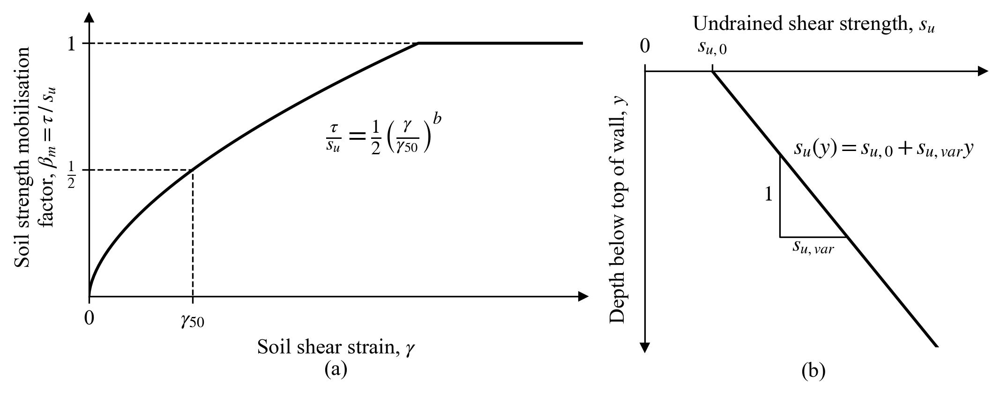

In [451]:
fig = plt.figure(
    figsize=(7,2.7), 
    dpi=300,
    constrained_layout=True,
)

subfigs = fig.subfigures(1, 2, width_ratios=[1.5, 1])

subfigs[0].subplots(1,1)
ax = plt.gca()

plt.annotate(letter[0], [0.5, -0.3], xycoords='axes fraction', ha='center', va='bottom', fontsize=abfs)

b = 0.6
betas = np.hstack([np.linspace(0, 1, 50), [1]])
gamma_norm = (2 * betas) ** (1 / b)
gamma_norm[-1] = gamma_norm[-2] * 1.9

plt.plot(gamma_norm, betas, 'k-')
plt.xlim(0, 2**(1 / b) * 1.5)
plt.ylim(0, 1.1)

plt.plot([0, gamma_norm[-2]], [1, 1], "k--", lw=.8)
plt.plot([0, 1, 1], [.5, .5, 0], "k--", lw=.8)

plt.plot(plt.xlim()[1], [0], "k>", ms=4, clip_on=False)
plt.plot([0], plt.ylim()[1], "k^", ms=4, clip_on=False)
ax.spines.right.set_visible(False)
ax.spines.top.set_visible(False)
ax.tick_params(direction="out")

plt.xlabel(r"Soil shear strain, $\gamma$""\n", fontsize=axsfs)
plt.ylabel("Soil strength mobilisation\n"r"factor, $\beta_m=\tau\:/\:s_u$", fontsize=axsfs)

plt.yticks([.5, 1], labels=[r"$\frac{1}{2}$", "$1$"], fontsize=axsfs)
plt.xticks([0, 1], labels=[0, "$\gamma_{50}$"], fontsize=axsfs)

plt.annotate(r"$\frac{\tau}{s_u}=\frac{1}{2}\left(\frac{\gamma}{\gamma_{50}}\right)$", (3.3, .7), fontsize=14, ha="right", va="top")
plt.annotate(r"$b$", (3.4, .73), fontsize=9, ha="right", va="top")

subfigs[1].subplots(1,1)
ax = plt.gca()

plt.annotate(letter[1], [0.5,-0.05], xycoords='axes fraction', ha='center', va='top', fontsize=abfs)

su0 = 1.5
suvar = 1
su = lambda y: su0 + y * suvar
ymax = 5

ys = np.linspace(0, ymax)

plt.plot(su(ys), ys, 'k-')
plt.xlim(0, su(ys[-1]) + 1)
plt.ylim(ymax, 0)

plt.plot(plt.xlim()[1], [0], "k>", ms=4, clip_on=False)
plt.plot([0], plt.ylim()[0], "kv", ms=4, clip_on=False)

y1 = 1.5
y2 = 3
plt.plot([su(y1), su(y1), su(y2)], [y1, y2, y2], 'k-', lw=.8)
plt.annotate("$s_{u,var}$", ((su(y1) + su(y2)) / 2, y2), ha="center", va="top", fontsize=axsfs)
plt.annotate("$1$  ", (su(y1), (y1 + y2) / 2), ha="right", va="center", fontsize=axsfs)

ax.spines.right.set_visible(False)
ax.spines.bottom.set_visible(False)
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.tick_params(direction="out") 

plt.xlabel("Undrained shear strength, $s_u$", fontsize=axsfs)
plt.ylabel("Depth below top of wall, $y$", fontsize=axsfs)

plt.yticks([])
plt.xticks([0, su0], labels=[0, "$s_{u,0}$"], fontsize=axsfs)

plt.annotate(r"$s_u(y)=s_{u,0} + s_{u,var}y$", (su(y1) + .3, y1), fontsize=12)

plt.savefig(fig_file+"\Figure A2_v2.svg")